# Artificial Intelligence for Cybersecurity Project
**Venturini Francesco** No. 548415

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.feature_selection import SelectKBest, chi2

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold


from sklearn.metrics import confusion_matrix, zero_one_loss, ConfusionMatrixDisplay, classification_report, accuracy_score

# TO DO delete
# from sklearn.cluster import KMeans
# from sklearn.metrics.cluster import contingency_matrix
# from sklearn.metrics import homogeneity_completeness_v_measure
# from sklearn.decomposition import PCA
# from sklearn.neighbors import LocalOutlierFactor as LOF

# Dataset description and Goal
The dataset that has been chosen for the project is the **`UNSW-NB15`  dataset**, created by the IXIA PerfectStorm tool 
in the Cyber Range Lab of the Australian Centre for Cyber Security (ACCS) for generating a 
hybrid of real modern normal activities and synthetic contemporary attack behaviours. Tcpdump 
tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This data set has nine 
families of attacks, namely, `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, 
`Reconnaissance`, `Shellcode` and `Worms`. The Argus, Bro-IDS tools are utilised and twelve 
algorithms are developed to generate totally 49 features with the class label. These features are 
described in `UNSW-NB15_freatures.csv` file. The total number of records is two millions and 
540,044 which are stored in the four CSV files, namely, `UNSW-NB15_1.csv`, `UNSW-NB15_2.csv`, `UNSW-NB15_3.csv` and `UNSW-NB15_4.csv`. The ground truth table is named 
`UNSW-NB15_GT.csv` and the list of event file is called `UNSW-NB15_LIST_EVENTS.csv`. A
partition from this data set is configured as a training set and testing set, namely, 
`UNSW_NB15_training-set.csv` and `UNSW_NB15_testing-set.csv` respectively. The number of 
records in the training set is 82,332 records and the testing set is 175,341 records from different 
the types of attack and normal.

Input data files are available in the `datasets/UNSW-NB15` directory. The next cell will list all files under this directory.

The goal of the project is to devise a general classifier that categorizes each individual sample as 'attack' or 'normal' network traffic. The objective is to correctly develop a complete Knowledge Discovery from Data process (aka Data Mining). In parallel, a study of a multi-class classification problem was done, based on 10 types of attack categories. The work should produce good performance metrics that will be validated, evaluated and compared with existent works.

The followed procedure is the classical one of the Data Mining process, thus:

1) **Data acquisition and exploration**: first phase with data harvesting and visualization

2) **Data cleaning**: duplicate removal, missing values manage, erroneous data and other problems that affect data quality

3) **Data selection and Data preparation**: correlation analysis, feature selection, transformations, one-hot encoding, normalization

4) **Data modelling (classification)**: applying machine learning and data mining algorithms to build models that describes the data

5) **Validation and Evaluation**: statistical validation tests and metrics

6) **Results interpretation**


# 1. Data Acquisition and Exlporation

Pandas utilities are used to retireve the dataset from the CSV files. The result of read_csv is stored into a DataFrame data structure, e.g., a two-dimensional table-like form. 

In [3]:
for dirname, _, filenames in os.walk('../datasets/UNSW-NB15/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
dataset_root = '../datasets/UNSW-NB15/'

# datasets are switched
test = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_training-set.csv')
train = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_testing-set.csv')

# otherwise UTF-8 decoding error, Windows codepage 1252 is used
features = pd.read_csv(dataset_root + 'UNSW-NB15_features.csv', encoding='cp1252').set_index('No.') 
list_events = pd.read_csv(dataset_root + 'UNSW-NB15_LIST_EVENTS.csv')

# train and test set concatenation
train['type'] = 'train'
test['type'] = 'test'
df_total = pd.concat([train, test], axis=0, ignore_index=True)

# to see all the columns in outputs
pd.set_option('display.max_columns', None) 
df_total

../datasets/UNSW-NB15/The UNSW-NB15 description.pdf
../datasets/UNSW-NB15/UNSW-NB15_1.csv
../datasets/UNSW-NB15/UNSW-NB15_2.csv
../datasets/UNSW-NB15/UNSW-NB15_3.csv
../datasets/UNSW-NB15/UNSW-NB15_4.csv
../datasets/UNSW-NB15/UNSW-NB15_features.csv
../datasets/UNSW-NB15/UNSW-NB15_GT.csv
../datasets/UNSW-NB15/UNSW-NB15_LIST_EVENTS.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_testing-set.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_training-set.csv


,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,1.415894e+04,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0,train
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8.395112e+03,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0,train
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1.572272e+03,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0,train
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2.740179e+03,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0,train
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8.561499e+03,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257668,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,254,0,8.320000e+07,0.000000,0,0,0.005000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,52,0,0,0,1,2,2,1,1,2,0,0,0,2,1,0,Normal,0,test
257669,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,254,252,1.241044e+05,2242.109863,7,1,55.880051,143.700000,4798.130981,190.980813,255,1072535109,3284291478,255,0.173208,0.100191,0.073017,903,44,0,0,1,1,2,1,1,1,0,0,0,3,2,0,Normal,0,test
257670,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.720000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test
257671,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.732000,0.000000,10.954518,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test


Let's see the dimensionality and an extract of the content:

In [4]:
print(f"Training set shape: {train.shape}\n")
print(f"Test set shape: {test.shape}\n")
print(f"Total set shape: {df_total.shape}\n")

Training set shape: (175341, 46)

Test set shape: (82332, 46)

Total set shape: (257673, 46)



In [5]:
# thanks to https://www.kaggle.com/code/khairulislam/unsw-nb15-eda?scriptVersionId=27690564&cellId=8
from pandas.api.types import is_datetime64_any_dtype as is_datetime
from pandas.api.types import is_categorical_dtype
def reduce_mem_usage(df, use_float16=False):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        if is_datetime(df[col]) or is_categorical_dtype(df[col]):
            # skip datetime type or categorical type
            continue
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if use_float16 and c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('object')
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

df_total = reduce_mem_usage(df_total)

Memory usage of dataframe is 90.43 MB
Memory usage after optimization is: 37.11 MB
Decreased by 59.0%


## 1.1 Feature statistics 

Attack categories:

In [6]:
list_events['Attack category'].unique()

array(['normal', ' Fuzzers ', ' Fuzzers', ' Reconnaissance ',
       ' Shellcode ', 'Analysis', 'Backdoors', 'DoS', 'Exploits',
       'Generic', 'Reconnaissance', 'Shellcode', 'Worms', nan],
      dtype=object)

Attack subcategories: 

In [7]:
list_events['Attack subcategory'].unique()

array([nan, 'FTP', 'HTTP', 'RIP', 'SMB', 'Syslog', 'PPTP', ' FTP',
       'DCERPC', 'OSPF', 'TFTP', ' DCERPC ', ' OSPF', 'BGP', 'Telnet',
       'SNMP', ' SunRPC Portmapper (TCP) UDP Service',
       ' SunRPC Portmapper (TCP) TCP Service ',
       'SunRPC Portmapper (UDP) UDP Service', 'NetBIOS', 'DNS',
       'SunRPC Portmapper (UDP)', ' ICMP', ' SCTP', 'MSSQL', 'SMTP',
       'FreeBSD', 'HP-UX ', 'NetBSD ', 'AIX', 'SCO Unix', 'Linux',
       'Decoders', 'IRIX', 'OpenBSD', ' Mac OS X', 'BSD', 'Windows',
       'BSDi', 'Multiple OS', 'Solaris', 'HTML', 'Port Scanner', 'Spam ',
       ' ', ' Ethernet', ' Microsoft Office', ' VNC', 'IRC', 'RDP', 'TCP',
       'VNC', ' LDAP', ' Oracle ', ' TCP', ' TFTP', 'XINETD', ' IRC',
       ' SNMP', 'ISAKMP', 'NTP', 'CUPS', 'Hypervisor', 'ICMP', 'SunRPC',
       ' IMAP', 'Asterisk', 'Browser', 'Cisco Skinny', 'SIP', 'SSL',
       ' SMTP', 'IIS Web Server', 'Miscellaneous', 'RTSP',
       ' Common Unix Print System (CUPS)', ' SunRPC', 'IGMP',
       '

The features and the relative descriptions are in the next cell. Note that `srcip`, `sport`, `dstip`, `dsport` are not present in the training set. 

In [8]:
# actually 45+1 (id) are present in the dataset
features.head(features.shape[0]) 

,Name,Type,Description
No.,,,
1,srcip,nominal,Source IP address
2,sport,integer,Source port number
3,dstip,nominal,Destination IP address
4,dsport,integer,Destination port number
5,proto,nominal,Transaction protocol
6,state,nominal,Indicates to the state and its dependent proto...
7,dur,Float,Record total duration
8,sbytes,Integer,Source to destination transaction bytes
9,dbytes,Integer,Destination to source transaction bytes


Print some information on the individual attributes, checking also the number of null instances:


In [9]:
for i, col_name in enumerate(train.columns):  
  print("{0:16}".format(col_name), " \tn_unique = {0:6}".format(train[col_name].nunique()), 
        "---> {0:5}%".format(round((100*train[col_name].nunique()/len(train[col_name])),2)),
        "\tnull_count = {}".format(train[col_name].isnull().sum())) 

id                	n_unique = 175341 ---> 100.0% 	null_count = 0
dur               	n_unique =  74039 ---> 42.23% 	null_count = 0
proto             	n_unique =    133 --->  0.08% 	null_count = 0
service           	n_unique =     13 --->  0.01% 	null_count = 0
state             	n_unique =      9 --->  0.01% 	null_count = 0
spkts             	n_unique =    480 --->  0.27% 	null_count = 0
dpkts             	n_unique =    443 --->  0.25% 	null_count = 0
sbytes            	n_unique =   7214 --->  4.11% 	null_count = 0
dbytes            	n_unique =   6660 --->   3.8% 	null_count = 0
rate              	n_unique =  76991 ---> 43.91% 	null_count = 0
sttl              	n_unique =     11 --->  0.01% 	null_count = 0
dttl              	n_unique =      6 --->   0.0% 	null_count = 0
sload             	n_unique =  80885 ---> 46.13% 	null_count = 0
dload             	n_unique =  77474 ---> 44.18% 	null_count = 0
sloss             	n_unique =    409 --->  0.23% 	null_count = 0
dloss             	n_uniq

Let's see the description of the features (including non-numerical attributes)

In [10]:
train.describe(include='all') 

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
count,175341.000000,175341.000000,175341,175341,175341,175341.000000,175341.000000,1.753410e+05,1.753410e+05,1.753410e+05,175341.000000,175341.000000,1.753410e+05,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,1.753410e+05,175341.000000,175341.000000,1.753410e+05,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341,175341.000000,175341
unique,NaN,NaN,133,13,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,1
top,NaN,NaN,tcp,-,INT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,NaN,train
freq,NaN,NaN,79946,94168,82275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56000,NaN,175341
mean,87671.000000,1.359389,NaN,NaN,NaN,20.298664,18.969591,8.844844e+03,1.492892e+04,9.540619e+04,179.546997,79.609567,7.345403e+07,6.712056e+05,4.953000,6.948010,985.976864,88.216296,4.976254e+03,604.353826,116.257339,9.692504e+08,9.688770e+08,115.013625,0.041396,0.021020,0.020375,136.751769,124.173382,0.105982,2.144292e+03,9.306437,1.304179,6.193936,5.383538,4.206255,8.729881,0.014948,0.014948,0.133066,6.955789,9.100758,0.015752,NaN,0.680622,NaN
std,50616.731112,6.480249,NaN,NaN,NaN,136.887597,110.258271,1.747656e+05,1.436542e+05,1.654010e+05,102.940011,110.506863,1.883574e+08,2.421312e+06,66.005059,52.732999,7242.245841,987.093195,4.496585e+04,4061.043281,127.001024,1.355264e+09,1.354000e+09,126.886530,0.079354,0.043400,0.040506,204.677360,258.317056,0.776911,5.420797e+04,10.704331,0.954406,8.052476,8.047104,5.783585,10.956186,0.126048,0.126048,0.701208,8.321493,10.756952,0.124516,NaN,0.466237,NaN
min,1.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.800000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,28.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,NaN
25%,43836.000000,0.000008,NaN,NaN,NaN,2.000000,0.000000,1.140000e+02,0.000000e+00,3.278614e+01,62.000000,0.000000,1.305334e+04,0.000000e+00,0.000000,0.000000,0.008000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000,0.000000,0.000000e+00,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,NaN,0.000000,NaN
50%,87671.000000,0.001582,NaN,NaN,NaN,2.000000,2.000000,4.300000e+02,1.640000e+02,3.225807e+03,254.000000,29.000000,8.796748e+05,1.447023e+03,0.000000,0.000000,0.279733,0.006000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,73.000000,44.000000,0.000000,0.000000e+00,5.000000,1.000000,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,4.000000,0.000000,NaN,1.000000,NaN
75%,131506.000000,0.668069,NaN,NaN,NaN,12.000000,10.000000,1.418000e+03,1.102000e+03,1.250000e+05,254.000000,252.000000,8.888889e+07,2.784487e+04,3.000000,2.000000,55.156896,51.053000,2.513295e+03,114.990625,255.00


We can take a look at the training data class distribution (binary and 10 classes breakdown):

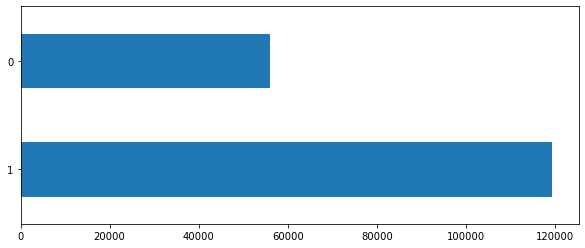

In [11]:
train_label = train['label'].value_counts()
train_label.plot(kind='barh', figsize=(10,4), fontsize=10);

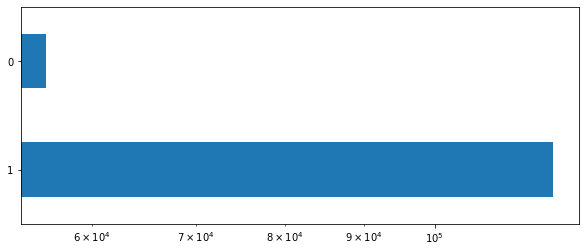

In [12]:
# logarithmic scale
train_label.plot(kind='barh', logx=True, figsize=(10,4), fontsize=10);

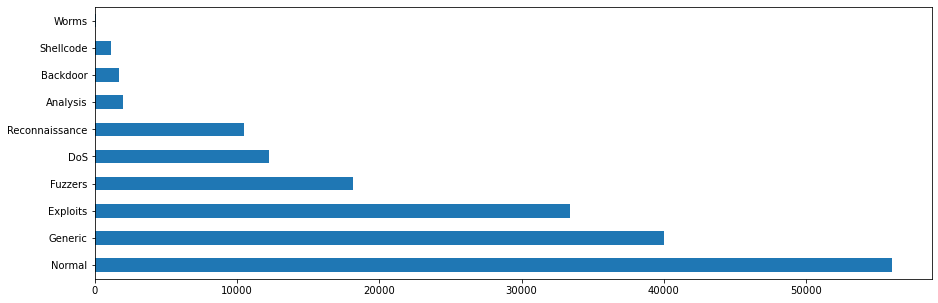

In [13]:
train_attack_cats = train['attack_cat'].value_counts()
train_attack_cats.plot(kind='barh', figsize=(15,5), fontsize=10);

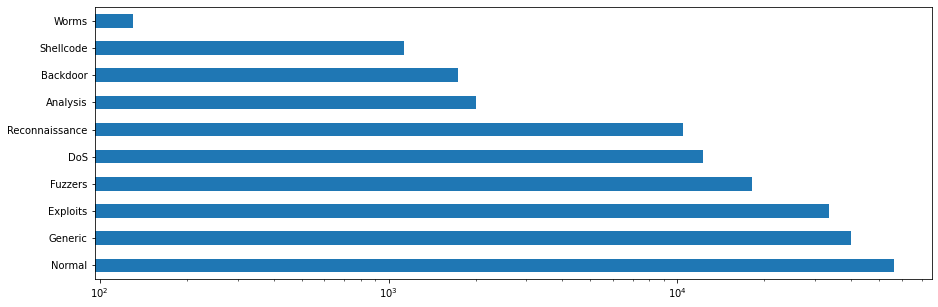

In [14]:
# the same plots as before in a logarithmic representation:
train_attack_cats.plot(kind='barh', logx=True, figsize=(15,5), fontsize=10);

One obvious observation is that the classes are tremendously imbalanced. For instance, the `Worms` class is smaller than the `Exploits` class. If we ignore this class imbalance and use the training data as is, there is a chance that the model will learn a lot more about, e.g., the `Normal` and the `Generic` classes compared to the `Worms` and `Shellcode` classes, which can result in an undesirable bias in the classifier. 
The same can be said for the binary classification problem. 

Now, let's take a look at some data. Data visualization provides many additional techniques for viewing data through graphical means. These can help in identifying relations, trends, and biases "hidden" in unstructured data sets. 

C:\Users\Francesco\AppData\Local\Temp\ipykernel_9632\3080312487.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (14, 3))


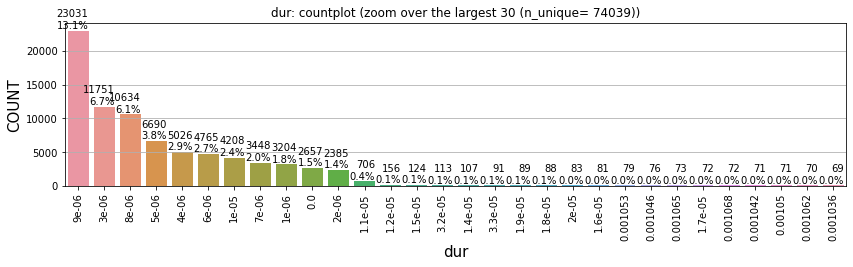

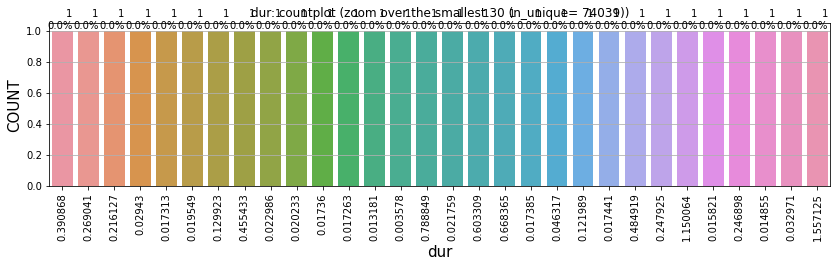

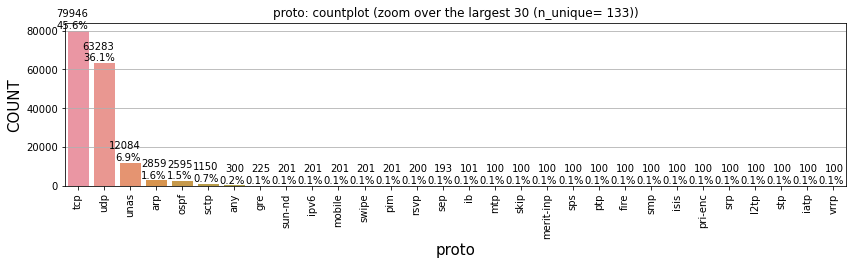

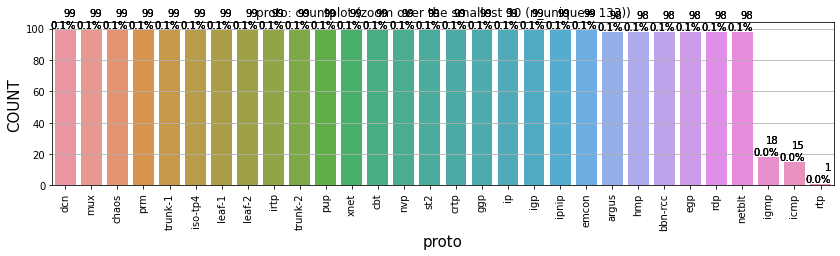

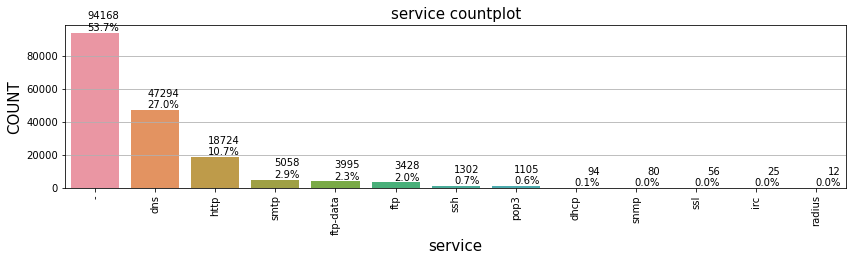

...

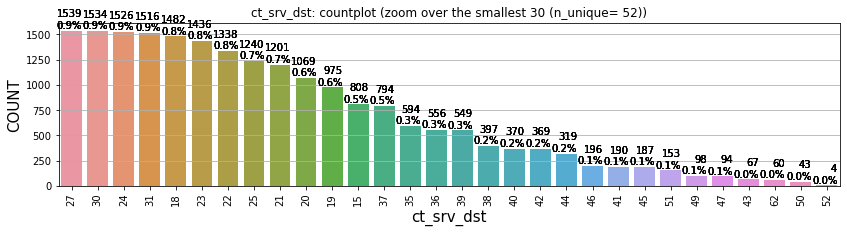

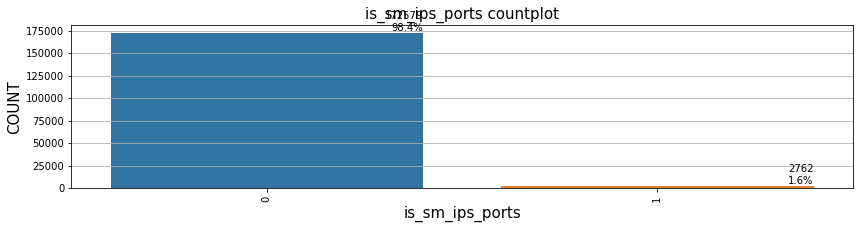

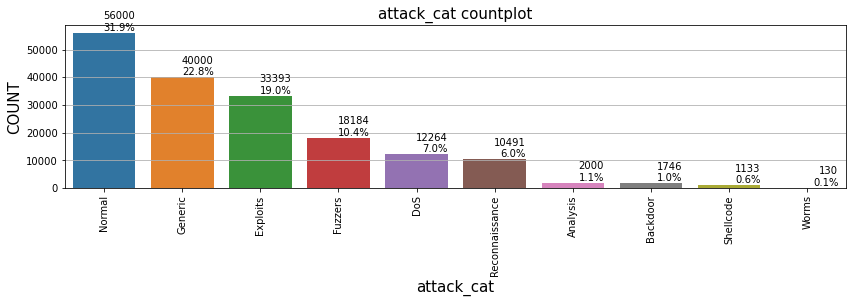

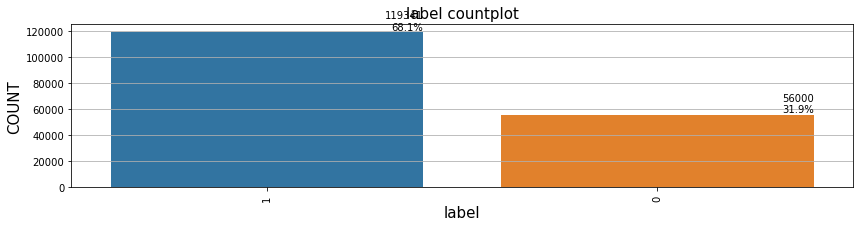

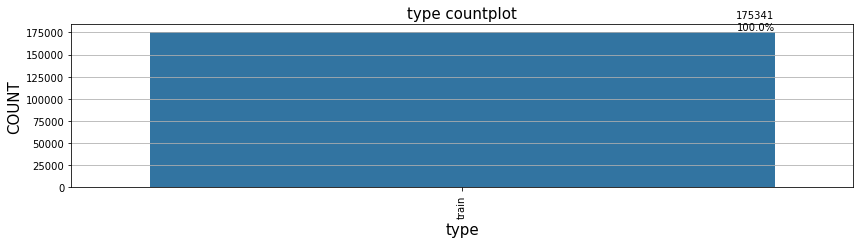

In [15]:
df_to_plot = train.copy().drop(['id'], axis=1) # useless
df_columns = df_to_plot.columns

for i, var in enumerate(df_columns):
    max_largest = 30

    largest = min(max_largest, df_to_plot[var].nunique())
    n_nunique_var = df_to_plot[var].nunique()
    tot = len(df_to_plot[var])
    n_null = df_to_plot[var].isnull().sum() 

    plt.figure(figsize = (14, 3))
    ax = sns.countplot(x=var, order=df_to_plot[var].value_counts().iloc[:largest].index, data=df_to_plot)
    plt.xticks(rotation=90, fontsize=10)
    plt.yticks(fontsize = 10)
    plt.xlabel(var, fontsize = 15)
    plt.ylabel('COUNT', fontsize = 15)

    if max_largest == largest:
        plt.title(f'{var}: countplot (zoom over the largest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
    else:
        plt.title(f'{var} countplot', fontsize = 15)

    plt.grid(axis = 'y')

    for p in ax.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x,y), ha='right', va='bottom')

    if max_largest == largest: 
        plt.figure(figsize = (14, 3))
        ax_lower = sns.countplot(x = var, order = df_to_plot[var].value_counts().iloc[-largest:].index, data = df_to_plot)
        plt.xticks(rotation = 90, fontsize = 10)
        plt.yticks(fontsize = 10)
        plt.xlabel(var, fontsize = 15)
        plt.ylabel('COUNT', fontsize = 15)
        plt.title(f'{var}: countplot (zoom over the smallest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
        plt.grid(axis='y')

    for p in ax_lower.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax_lower.annotate(percentage, (x,y), ha='right', va='bottom')

Some comments on the distributions: 

- `dur`: skwed to the right, big range of values
- `proto`: skwed to the right, mainly tcp and udp
- `service`: skwed, '-' means else
- `state`: skwed
- `spkts`: skwed, medium range of values 
- `dpkts`: similar distribution of spkts 
- `sbytes`: similar to the distribution above 
- `dbytes`: similar to the distribution above
- `rate`: skwed, big range of values 
- `sttl`: skwed 
- `dttl`: skwed 
- `sload`: fairly balanced in the distribution 
- `dload`: mostly skwed to the right, 0 is the main value 
- `sloss`: similar to sent packets/bytes
- `dloss`: similar to sent received packets/bytes
- `sinpkt`: a bit skwed
- `dinpkt`: skwed  
- `sjit`: mostly skwed
- `djit`: mostly skwed
- `swin`: mainly 0 and 255 
- `dwin`: mainly 0 and 255 
- `stcpb`: half are 0 
- `dtcpb`: half are 0 
- `tcprtt`: half are 0 
- `synack`: half are 0
- `ackdat`: half are 0 
- `smean`: skwed 
- `dmean`: skwed
- `trans_depth`: mostly 0 
- `response_body_len`: mostly 0 
- `ct_srv_src`: a bit skwed 
- `ct_state_ttl`: fairly distributed 
- `ct_dst_ltm`: fairly distributed 
- `ct_src_dport_ltm`: mostly 1
- `ct_dst_sport_ltm`: mostly 1 
- `ct_dst_src_ltm`: a bit skwed 
- `is_ftp_login`: mostly 0
- `ct_ftp_cmd`: mostly 0 
- `ct_flw_http_mthd`: mostly 0
- `ct_src_ltm`: fairly distributed
- `ct_src_dst`: a bit skwed
- `is_sm_ips_port`: mostly 0 

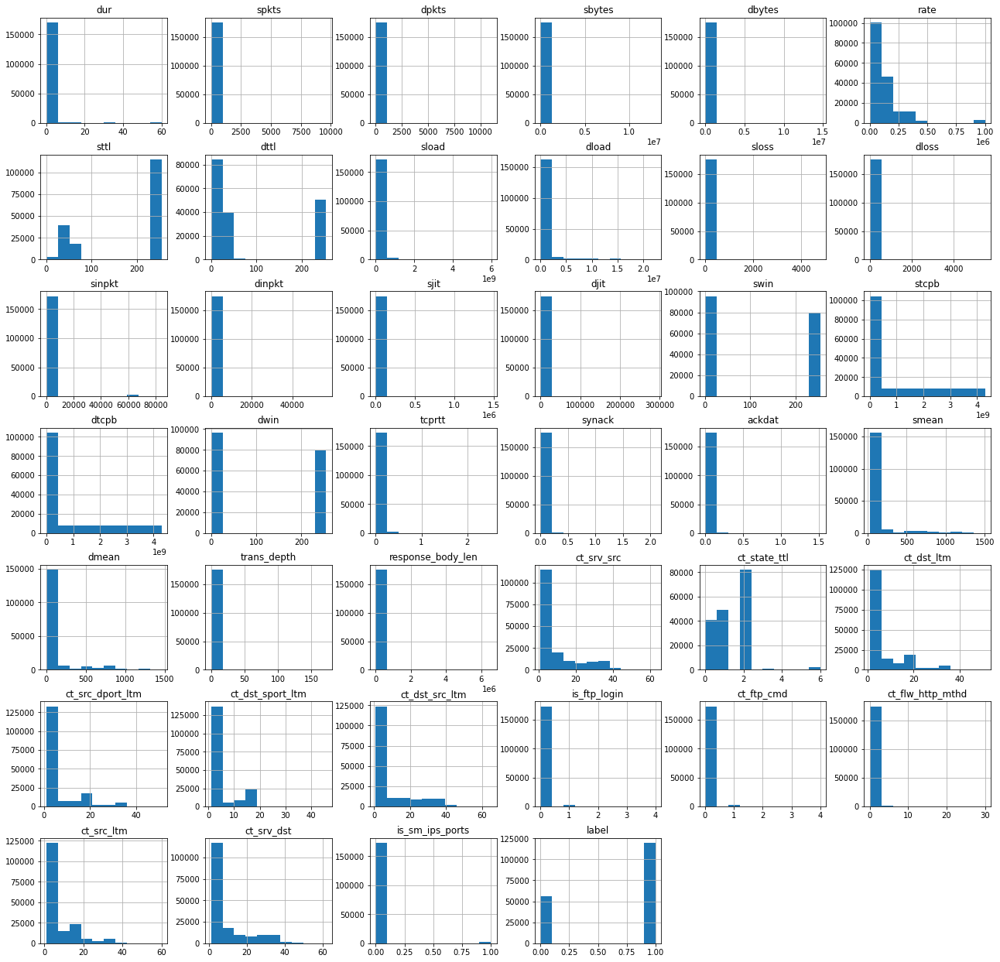

In [16]:
# all together
df_to_plot.hist(figsize=(22,22));

## 1.2 Datatypes understanding

In [17]:
# data types of each column, mixed types are stored with the `object` dtype
df_total.dtypes 

id                     int32
dur                  float32
proto                 object
service               object
state                 object
spkts                  int16
dpkts                  int16
sbytes                 int32
dbytes                 int32
rate                 float32
sttl                   int16
dttl                   int16
sload                float32
dload                float32
sloss                  int16
dloss                  int16
sinpkt               float32
dinpkt               float32
sjit                 float32
djit                 float32
swin                   int16
stcpb                  int64
dtcpb                  int64
dwin                   int16
tcprtt               float32
synack               float32
ackdat               float32
smean                  int16
dmean                  int16
trans_depth            int16
response_body_len      int32
ct_srv_src              int8
ct_state_ttl            int8
ct_dst_ltm              int8
ct_src_dport_l

From the previous output, the describe output and the specification of the dataset in the documentation, we can see the presence of:
- 3 categorical features (*proto*, *service*, *state*)
- 2 (asymmetric) binary features (*is_ftp_login*, *is_sm_ips_ports*)
- 2 possible target features (*attack_cat*, *label*)
- the *others* are numerical features (float or int)

## 1.3 An insight on specific attacks
This paragraph it is not aimed at a deep data visualization analysis of the dataset but is useful to understand some insights.  

In [18]:
fuzzers_df = df_total[df_total['attack_cat'] == 'Fuzzers' ]
fuzzers_df.describe(include='all')

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
count,24246.000000,24246.000000,24246,24246,24246,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.0,24246,24246.0,24246
unique,NaN,NaN,129,4,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,2
top,NaN,NaN,tcp,-,FIN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fuzzers,NaN,train
freq,NaN,NaN,15474,21980,15461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24246,NaN,18184
mean,81532.686175,2.673930,NaN,NaN,NaN,13.764827,6.095686,6.764303e+03,518.772127,67267.070312,253.407944,160.900272,1.276859e+08,3.221342e+03,3.863648,1.152644,410.948029,318.406891,2.159783e+04,846.070251,162.743133,1.368714e+09,1.365963e+09,162.743133,0.098788,0.052170,0.046617,238.826198,38.831601,0.048462,2.734224,6.124557,1.421224,2.527345,2.133548,1.416399,4.412975,0.005857,0.005857,0.063309,3.376557,5.436691,0.0,NaN,1.0,NaN
std,37362.040062,9.441679,NaN,NaN,NaN,34.371893,8.298022,4.294158e+04,5693.725260,142351.781250,11.099163,121.015686,3.599787e+08,1.521265e+04,16.560744,2.522197,2595.423096,1603.147217,1.067143e+05,4766.822754,122.534856,1.427848e+09,1.426568e+09,122.534856,0.088006,0.048489,0.044075,320.664138,50.262911,0.214744,201.497561,6.059497,0.747720,3.135934,2.248636,1.174733,5.422104,0.078438,0.078438,0.344525,4.401981,5.842210,0.0,NaN,0.0,NaN
min,267.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.400000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,NaN,1.0,NaN
25%,53451.250000,0.000010,NaN,NaN,NaN,2.000000,0.000000,5.320000e+02,0.000000,19.497195,254.000000,0.000000,6.676498e+03,0.000000e+00,0.000000,0.000000,0.010000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.0,NaN,1.0,NaN
50%,72993.500000,0.589509,NaN,NaN,NaN,10.000000,6.000000,8.200000e+02,268.000000,33.898212,254.000000,252.000000,1.769602e+04,2.492026e+03,2.000000,1.000000,49.383499,69.468430,2.664123e+03,105.965721,255.000000,9.455292e+08,9.168295e+08,255.000000,0.108917,0.055150,0.048531,91.000000,44.000000,0.000000,0.000000,4.000000,1.000000,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,2.000000,4.000000,0.0,NaN,1.0,NaN
75%,104970.250000,1.080940,NaN,NaN,NaN,12.000000,8.000000,1.494000e+03,682.000000,100000.000000,254.000000,252.000000,8.000000e+07,4.427268e+03,3.000000,2.000000,92.156906,118.691534,4.967546e+03,184.254883,255.000000,2.601297e+09,2.603236e+09,255.000000,0.163411,0.085737,0.076118,252.000000,54.000000,0.000000,0.000000,7.000000,2.000000,2.000000,

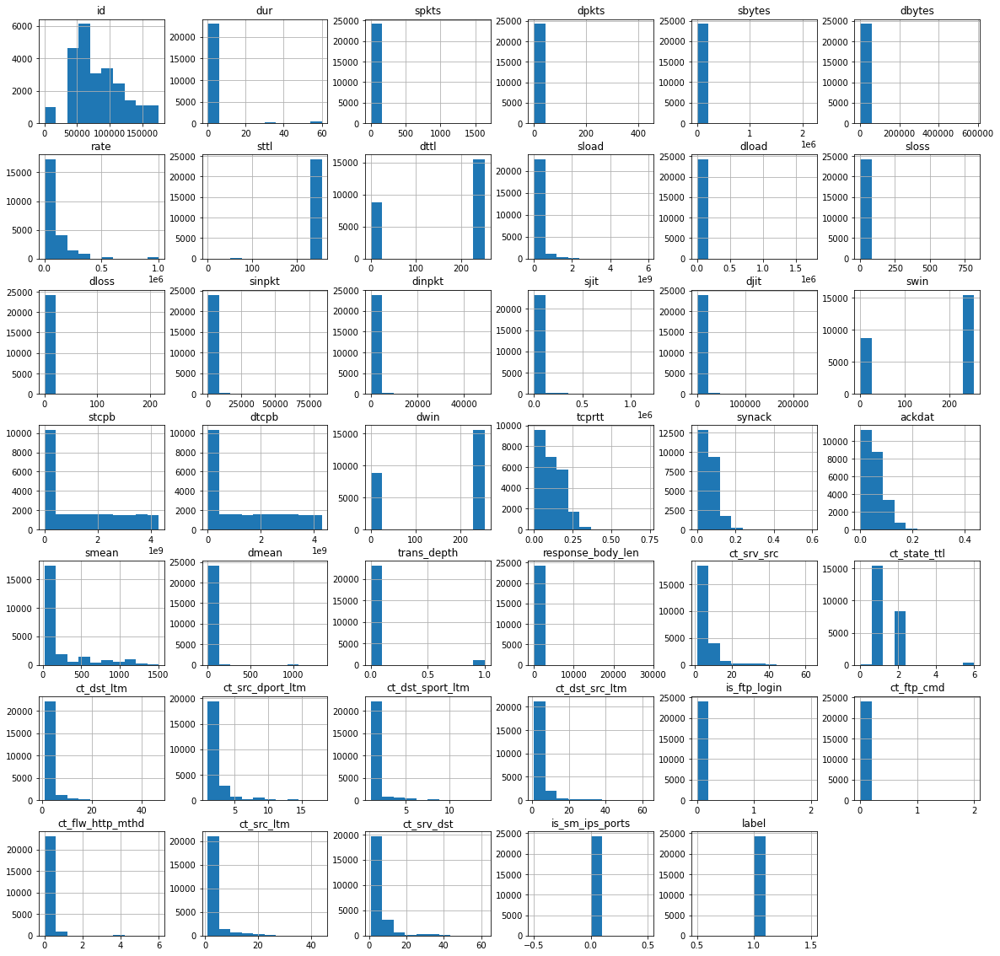

In [19]:
fuzzers_df.hist(figsize=(20,20));

With the general distributions we can spot some differences, like in the values taken in sttl and dttl. But also, for example, the maximum values of dur, spkts, dkpts, sbytes, dbytes, and a lot more. 

If we analyse the tendency of two attributes like *is_ftp_login* and *dur* we can, for example, spot that attacks belonging to the `Exploit` category are characterized by a higher value of the former feature (note that the attribute is binary but assumes values higher than 1, data cleaning is a step performed ahead), meanwhile no insights come from the latter one. 

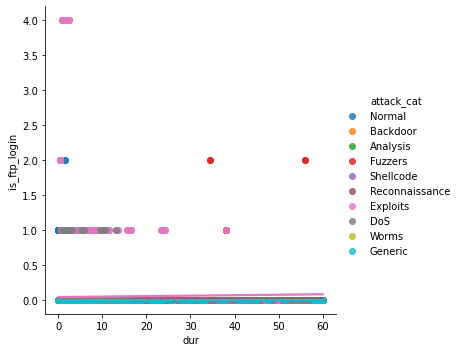

In [20]:
g = sns.lmplot(x="dur", y="is_ftp_login", data=df_total, hue="attack_cat")

With regard to the binary problem and the *attack* label:

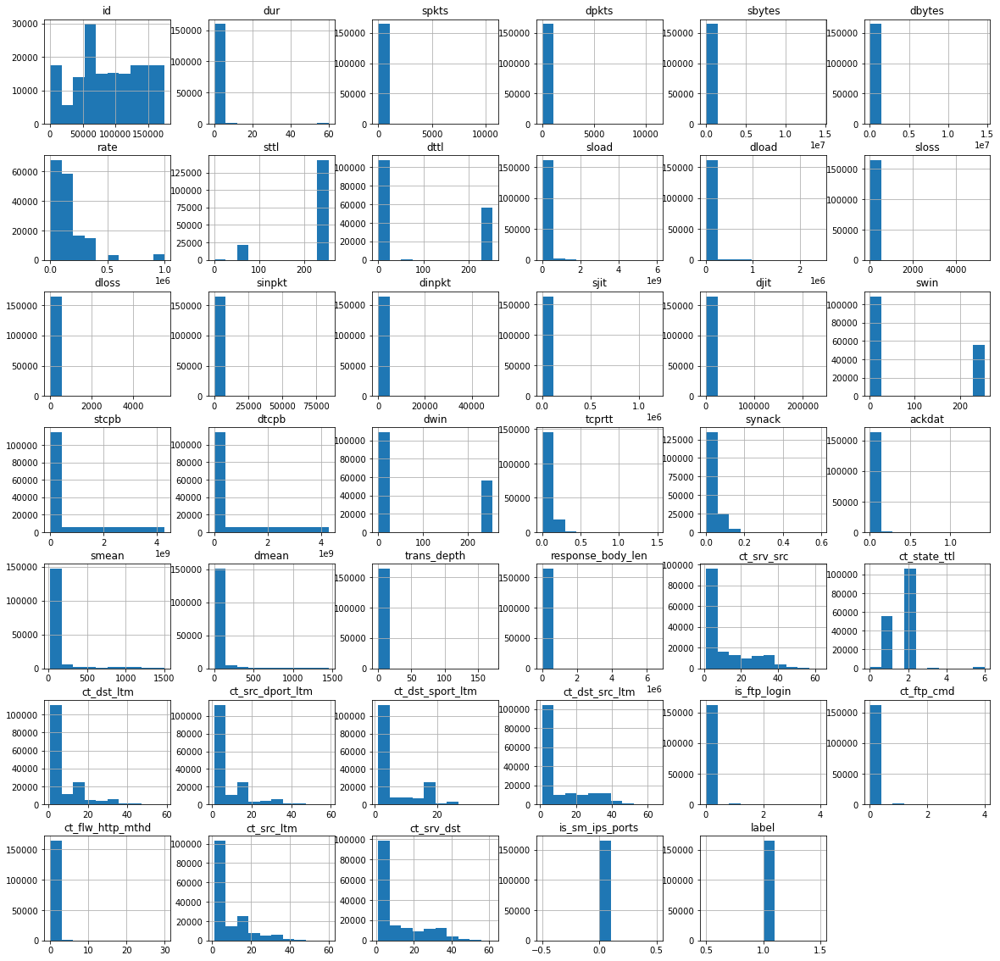

In [21]:
attacks_df = df_total[df_total['label'] == 1]
# attacks_df.describe(include='all')
attacks_df.hist(figsize=(20,20));

We can spot a little difference in the *swin* data distribution, different amplitudes in *stcpb* and *dtcpb*. But also different shapes for *tcprtt*, *synack* and *ackdat*, and so on and so forth. 

Take a look at categorical values for different attack categories:

In [22]:
# pip install -U kaleido

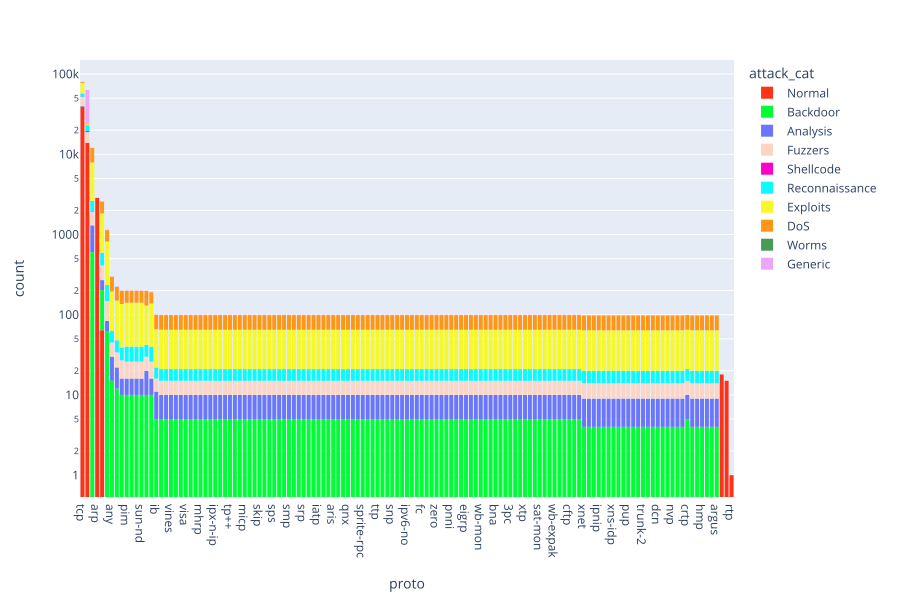

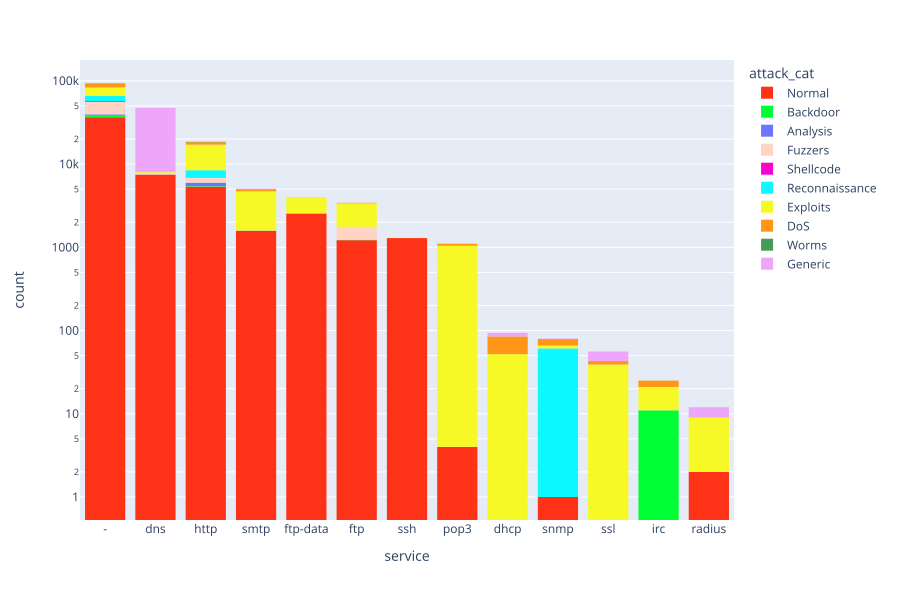

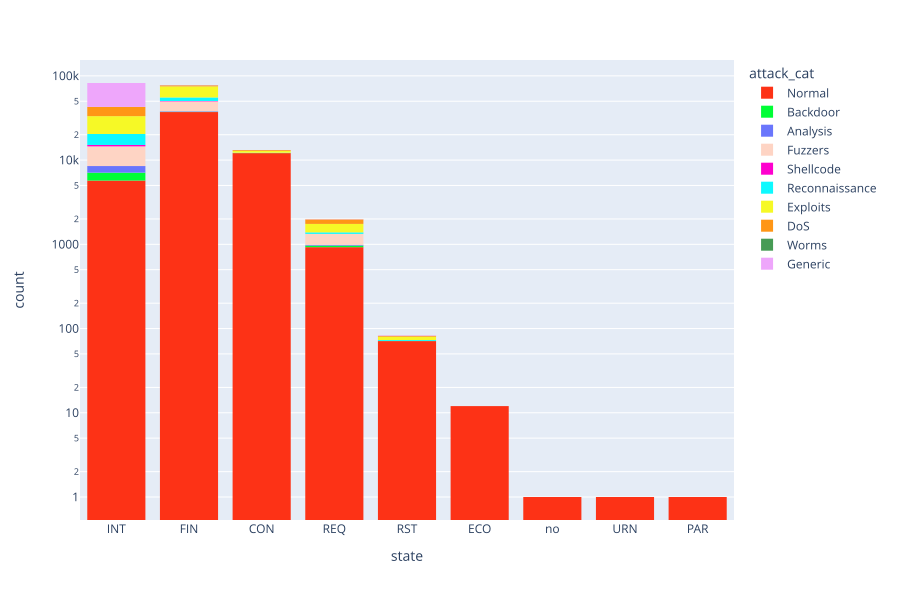

In [23]:
# multiclass
nominal_cols = train.select_dtypes(include='object').columns
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
        fig.update_layout(xaxis={'categoryorder':'total descending'})
        fig.show(renderer="svg", width=900, height=600)

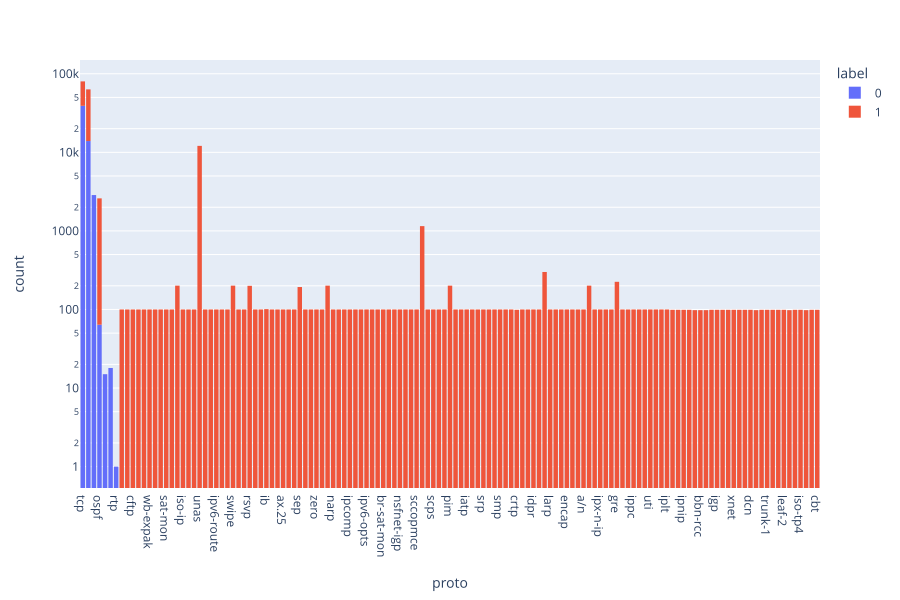

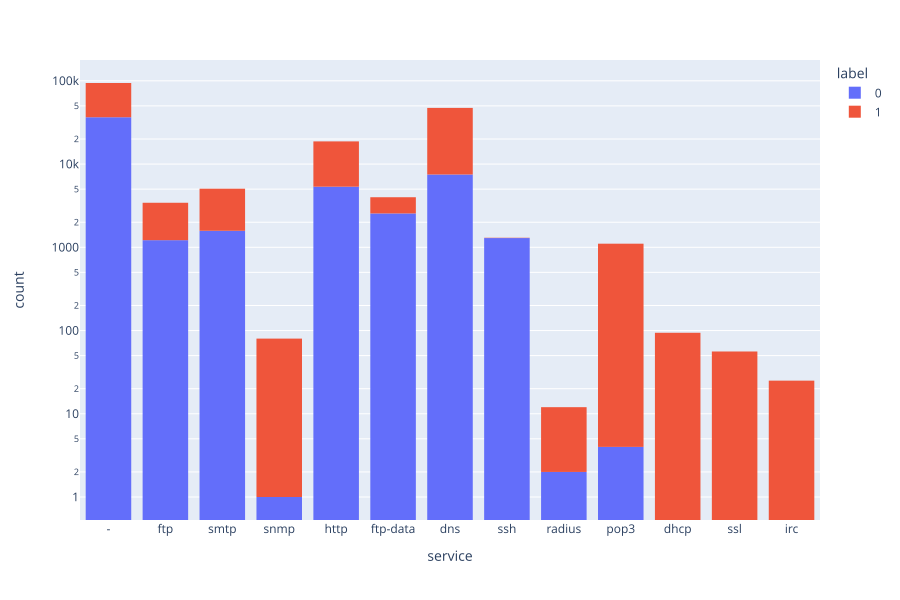

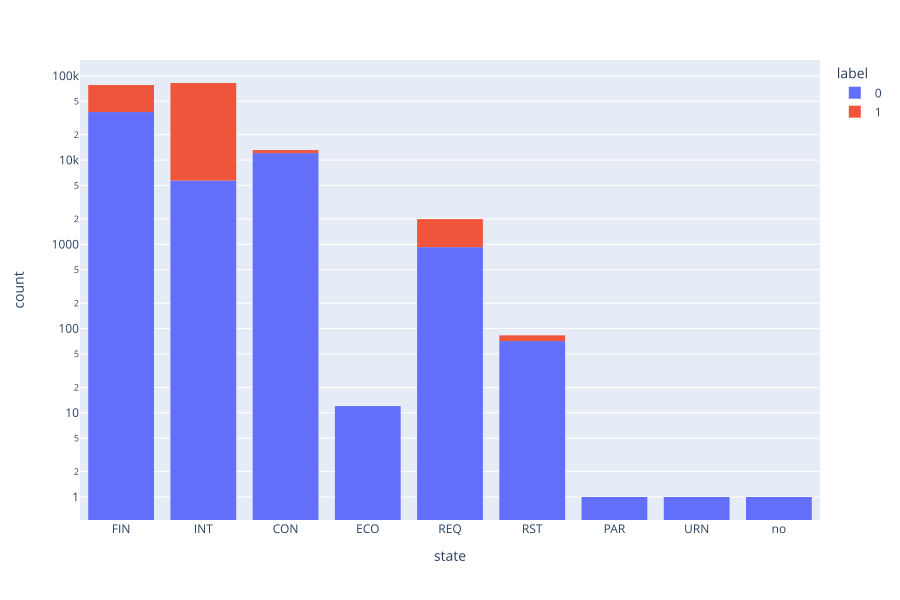

In [24]:
# binary class
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=900, height=600)

For example, most of the attacks have a 'particular' protocol type.

Let's do the same for the numeric attributes (only the binary case):

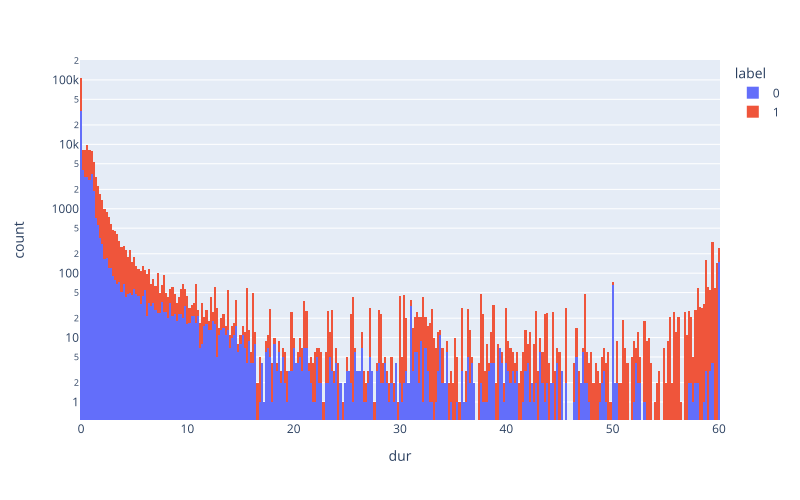

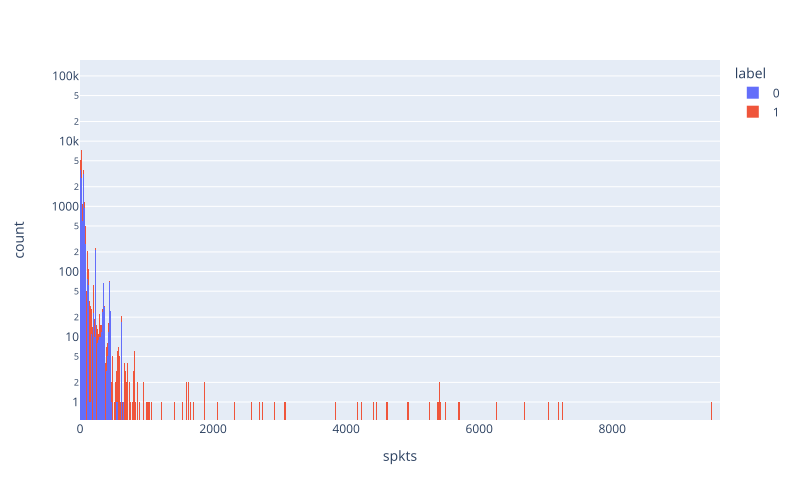

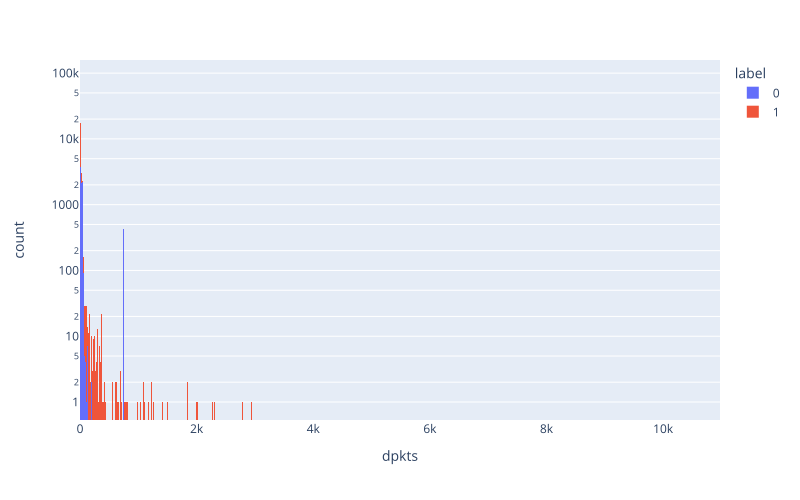

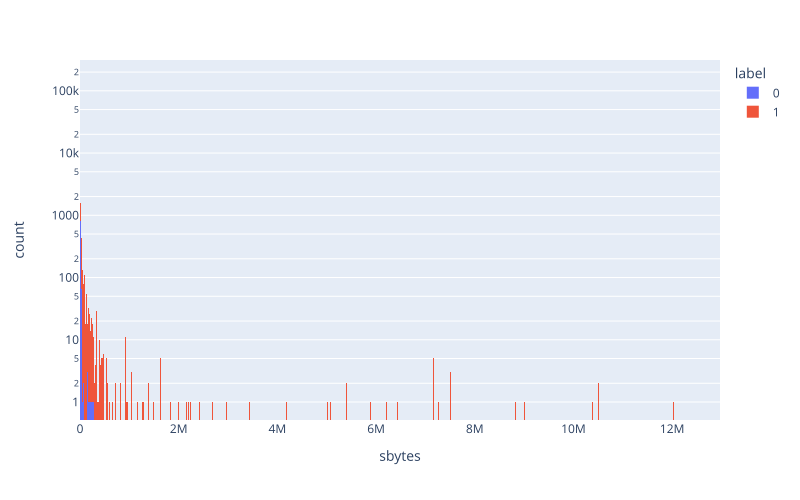

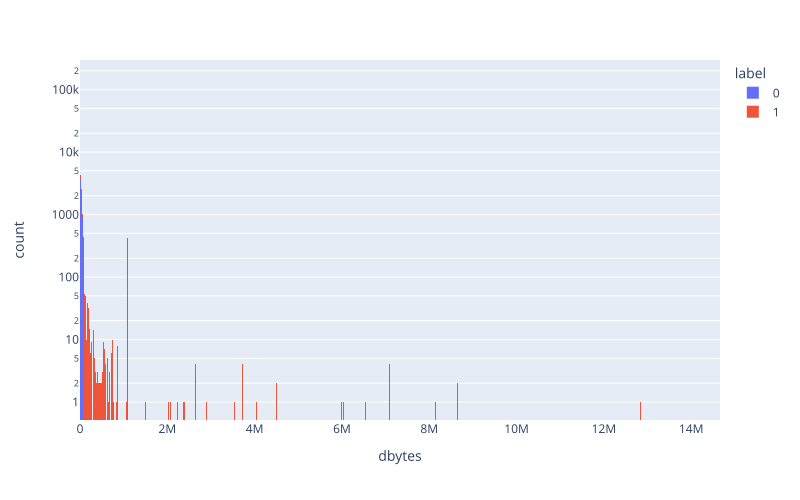

...

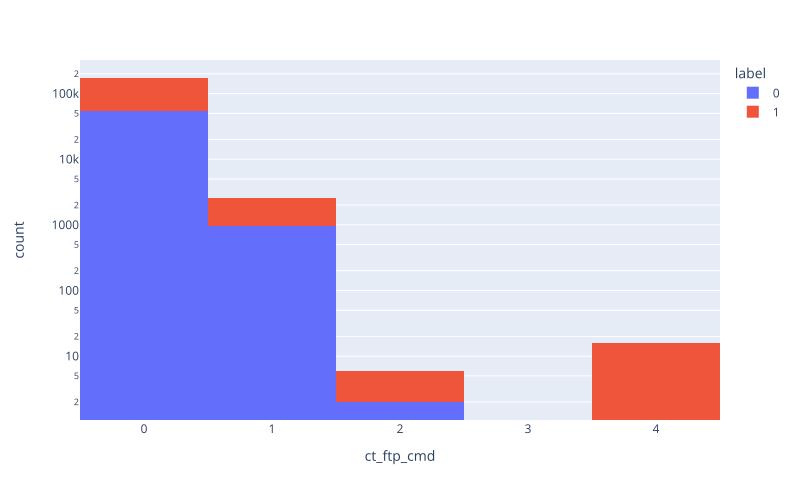

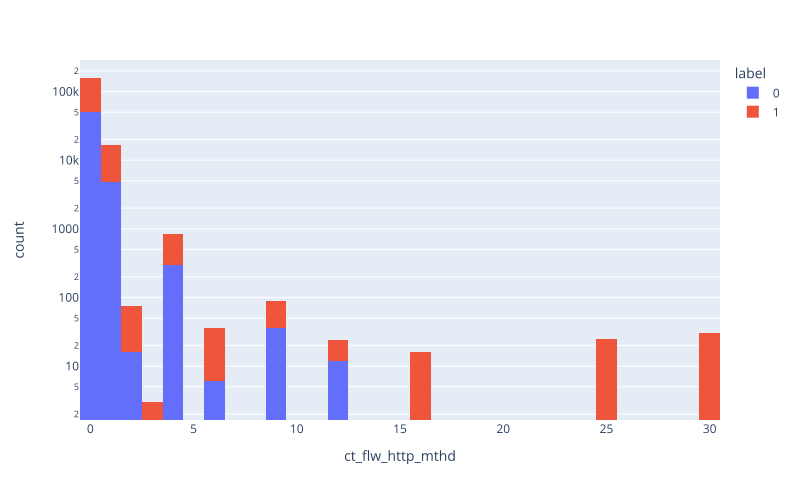

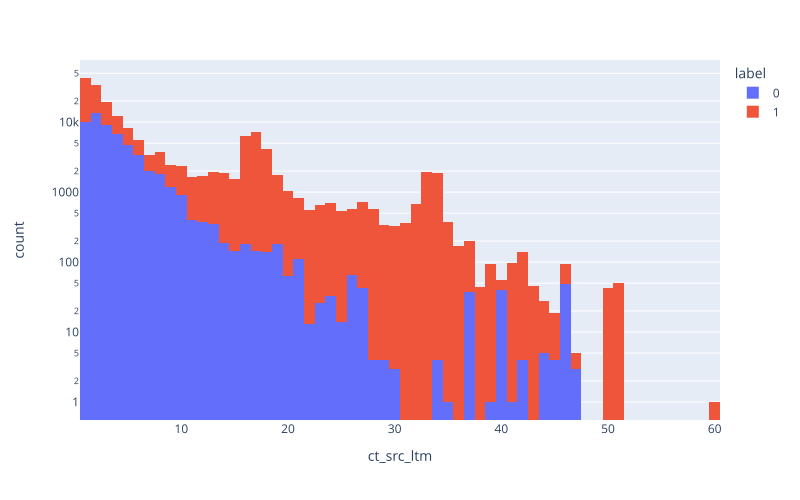

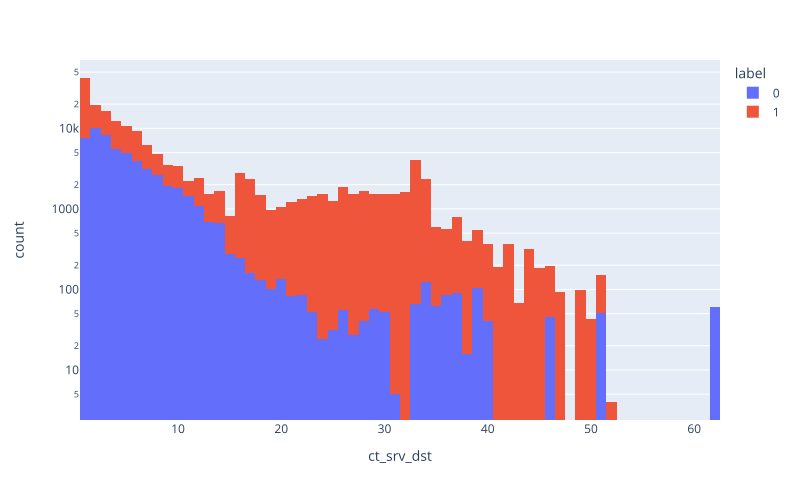

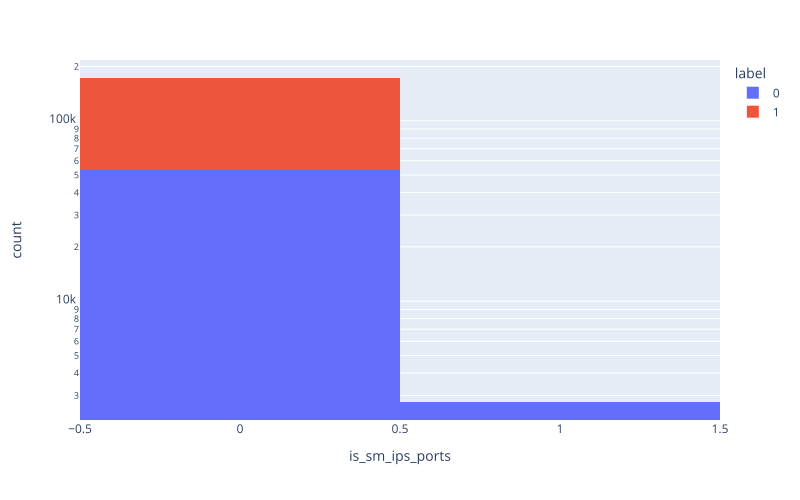

In [25]:
numeric_cols = train.select_dtypes(exclude='object').columns
for feature in numeric_cols:
    if feature != 'id' and feature != 'label':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=800, height=500)

In general, attacks have higher distributions w.r.t. non-attack ones. 

# 2. Data cleaning

The data cleaning phase is applied both to the training and the test set. It is an important phase because data quality has an high impact on the precision and the accuracy of the machine learning models. It is important to manage both the sets in the same manner to gurantee that the models will be evaluated equally and in a reliable manner. 


Data in real word is dirty. The may be:
- incomplete (missing values)
- noisy (containing noise, errors, outliers)
- inconsitent (containing dicrepancies)
- intentional 

Some utility variables for different feature types:

In [26]:
# retrieve features based on their types
col_names = np.array(df_total.columns)
nominal_idx = [2, 3, 4] # indexes of nominal features
binary_idx =  [37, 42] # indexes of binary features
target_idx = [43, 44, 45] # attack category, label and utility column for splitting
numeric_idx = list(set(range(43)).difference(nominal_idx).difference(binary_idx).difference(target_idx)) # indexes of numerical features


nominal_cols = col_names[nominal_idx].tolist()
binary_cols = col_names[binary_idx].tolist()
target_cols = col_names[target_idx].tolist()
numeric_cols = col_names[numeric_idx].tolist()

In [27]:
print("Check on columns assignment:\n")
print(f"nominal_cols = {nominal_cols}\n")
print(f"binary_cols  = {binary_cols}\n")
print(f"target_cols  = {target_cols}\n")
print(f"numeric_cols = {numeric_cols}\n")

Check on columns assignment:

nominal_cols = ['proto', 'service', 'state']

binary_cols  = ['is_ftp_login', 'is_sm_ips_ports']

target_cols  = ['attack_cat', 'label', 'type']

numeric_cols = ['id', 'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst']



## 2.1 Drop useless columns
Remove useless *id* column:

In [28]:
df_total.drop(['id'], axis=1, inplace=True)

## 2.2 Missing values check

In [29]:
df_total.isnull().values.any()

False

## 2.3 Consistency checking

Let's take a look at the *binary* features (index and column transposition is used). By definition, all of these features should have a min of 0.0 and a max of 1.0

In [30]:
df_total[binary_cols].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
is_ftp_login,257673.0,0.012819,0.116091,0.0,0.0,0.0,0.0,4.0
is_sm_ips_ports,257673.0,0.014274,0.118618,0.0,0.0,0.0,0.0,1.0


The `is_ftp_login` has a maximum value of 4

In [31]:
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254428
1      3219
2        10
4        16
dtype: int64

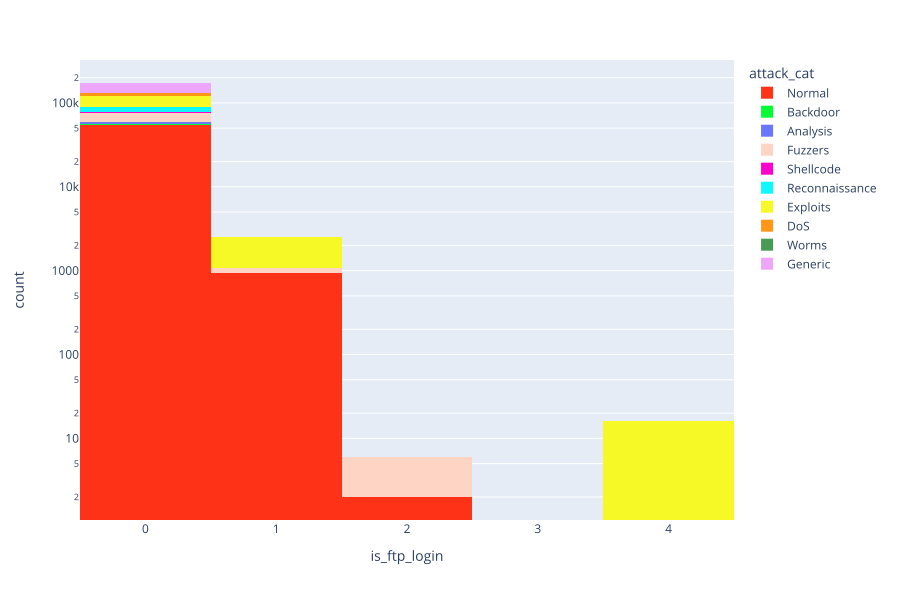

In [32]:
fig = px.histogram(train, x='is_ftp_login', log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show(renderer="svg", width=900, height=600)

TO DO this can be inferred with some more precise method

In [33]:
# Let's fix this discrepancy, from the picture above we can assume:
# is_ftp_login == 2 ==> 0 
# is_ftp_login == 4 ==> 1
df_total['is_ftp_login'].replace(2, 0, inplace=True)
df_total['is_ftp_login'].replace(4, 1, inplace=True)
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254438
1      3235
dtype: int64

## 2.4 Checking for single-value features

In [34]:
df_total.nunique()

dur                  109945
proto                   133
service                  13
state                    11
spkts                   646
dpkts                   627
sbytes                 9382
dbytes                 8653
rate                 115411
sttl                     13
dttl                      9
sload                121356
dload                116380
sloss                   490
dloss                   476
sinpkt               114102
dinpkt               110132
sjit                 116800
djit                 114673
swin                     22
stcpb                114473
dtcpb                114187
dwin                     19
tcprtt                63878
synack                57366
ackdat                53248
smean                  1377
dmean                  1362
trans_depth              14
response_body_len      2819
ct_srv_src               57
ct_state_ttl              7
ct_dst_ltm               52
ct_src_dport_ltm         52
ct_dst_sport_ltm         35
ct_dst_src_ltm      

## 2.5 Duplicates check

In [35]:
train.duplicated().sum()

0

In [36]:
test.duplicated().sum()

0

## 2.5 Smoothing, Clamping and Log Transform

In [37]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric:
    if df_numeric[feature].max()>10*df_numeric[feature].median() and df_numeric[feature].max()>10 :
        df_total[feature] = np.where(df_total[feature] < df_total[feature].quantile(0.95), df_total[feature], df_total[feature].quantile(0.95))

In [38]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric.columns:
    if df_numeric[feature].nunique() > 50:
        if df_numeric[feature].min() == 0:
            df_total[feature] = np.log(df_total[feature] + 1)
        else:
            df_total[feature] = np.log(df_total[feature])

## 2.6 Balance checking

In [39]:
# performed only on the training set
train['attack_cat'].unique() 

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

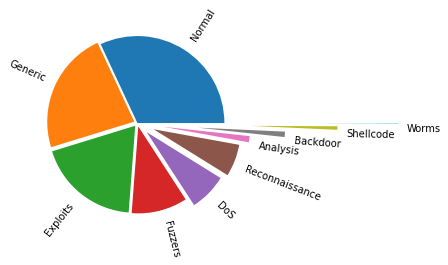

In [40]:
# multiclass problem --> imbalanced
wedges = train['attack_cat'].value_counts()
myexplode = [0, 0.04, 0.04, 0.04, 0.15, 0.2, 0.3, 0.7, 1.3, 2]
plt.pie(np.array(wedges), labels= wedges.index, explode=myexplode, rotatelabels=True)
plt.show()

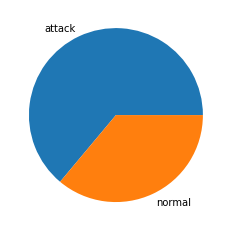

In [41]:
# binary classifiacation problem --> balanced
wedges = df_total['label'].value_counts()
plt.pie(np.array(wedges), labels= ['attack', 'normal'])
plt.show()

### 2.7 Correlation Analysis Insight


Correlation analysis it is most commonly performed on the training data. The purpose of performing correlation analysis on the training data is to identify the relationships between the independent variables (predictors) and the dependent variable (outcome). This information can then be used to inform the selection of predictors for a predictive model or to inform feature engineering efforts. 

<AxesSubplot:>

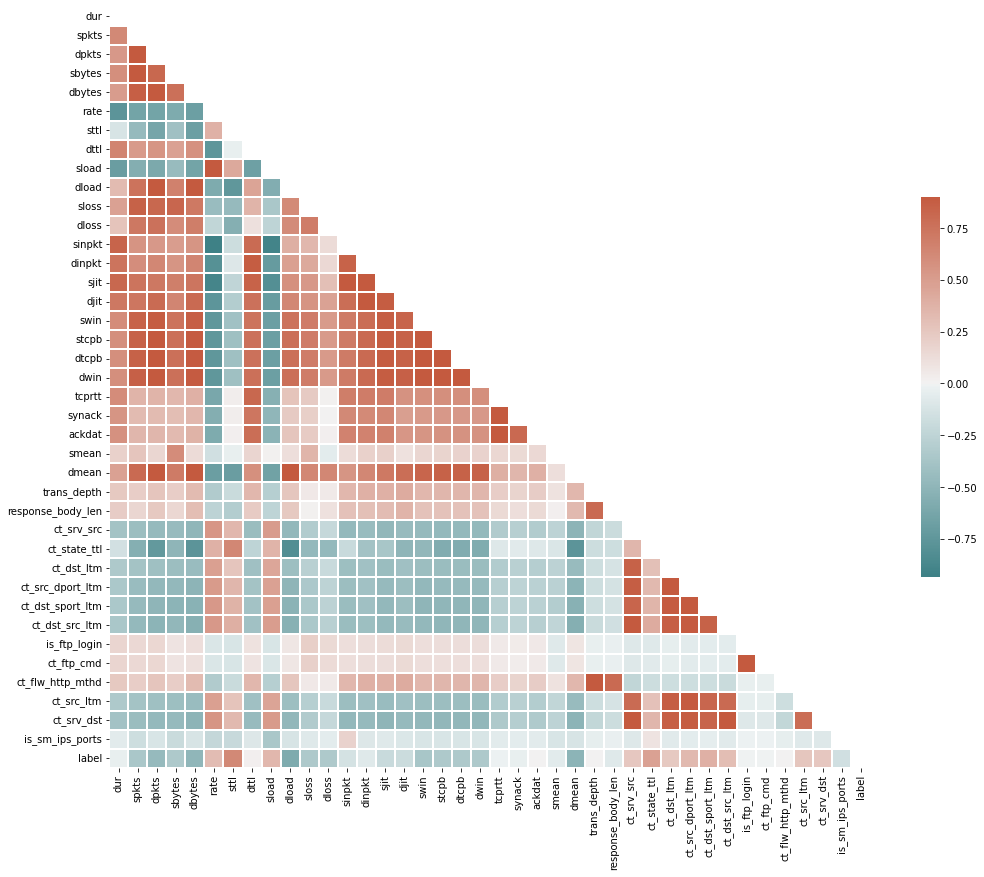

In [42]:
correlations = df_total.corr(method='pearson') # Pearson is needed for numerical data

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlations, dtype=bool))
fig, ax = plt.subplots(figsize=(18,14))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 20, as_cmap=True)
sns.heatmap(correlations, mask=mask, cmap=cmap, vmax=.9, center=0,
            square=True, linewidths=.1, cbar_kws={"shrink": .5})


In [43]:
def top_correlations(correlations, limit=0.95):
    columns = correlations.columns
    for i in range(correlations.shape[0]):
        for j in range(i+1, correlations.shape[0]):
            if correlations.iloc[i,j] >= limit or correlations.iloc[i,j] <= -limit:
                print(f"{columns[i]} <-> {columns[j]}  ==  {correlations.iloc[i,j]*100}")

top_correlations(correlations)

# Pearson
# limit == 0.9
# spkts <-> sbytes  ==  96.4393217155871
# spkts <-> sloss  ==  97.18594116510776
# dpkts <-> dbytes  ==  97.34453279792797
# dpkts <-> dloss  ==  97.9612084935938
# sbytes <-> sloss==  99.57715772406667
# dbytes <-> dloss  ==  99.67111338314551
# sinpkt <-> is_sm_ips_ports  ==  94.21206233324895
# swin <-> dwin  ==  98.04584289136497
# tcprtt <-> synack  ==  94.30527537645945
# tcprtt <-> ackdat  ==  92.02175912501836
# ct_srv_src <-> ct_dst_src_ltm  ==  95.39519771685964
# ct_srv_src <-> ct_srv_dst  ==  97.94668130725528
# ct_dst_ltm <-> ct_src_dport_ltm  ==  96.15176986568883
# ct_dst_ltm <-> ct_src_ltm  ==  90.15817705704372
# ct_src_dport_ltm <-> ct_dst_sport_ltm  ==  90.83371617418115
# ct_src_dport_ltm <-> ct_src_ltm  ==  90.94302805367734
# ct_dst_src_ltm <-> ct_srv_dst  ==  96.03212131064117
# is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241
# ------------------------------------------------------
# limit == 0.95
# dpkts <-> dbytes  ==  97.76737002221728
# dbytes <-> dload  ==  95.09783492996641
# dbytes <-> dmean  ==  98.76156469268844
# rate <-> sload  ==  97.30769401765275
# dload <-> dmean  ==  96.52106425259068
# swin <-> stcpb  ==  97.87232735525889
# swin <-> dtcpb  ==  97.85822124027848
# swin <-> dwin  ==  98.04584289136497
# stcpb <-> dtcpb  ==  99.61466213840428
# stcpb <-> dwin  ==  99.76286485467159
# dtcpb <-> dwin  ==  99.77706791818485
# tcprtt <-> synack  ==  95.35300491978894
# trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
# ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
# ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
# ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
# is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241

# Spearman
# limit == 0.9
# spkts <-> dpkts  ==  91.64563064808364
# spkts <-> sloss  ==  92.9289792172513
# spkts <-> dloss  ==  91.15810431436245
# dpkts <-> dbytes  ==  98.94239885330065
# dpkts <-> dload  ==  90.2105049332341
# dpkts <-> sloss  ==  92.64790033072707
# dpkts <-> dloss  ==  95.7332872819865
# dpkts <-> dwin  ==  90.70480261041583
# dpkts <-> dmean  ==  92.91055696558617
# dbytes <-> dload  ==  92.12942945361041
# dbytes <-> dloss  ==  94.76466651202257
# dbytes <-> dmean  ==  96.08834522066077
# rate <-> sload  ==  95.9916527208592
# rate <-> sinpkt  ==  -95.48540066354234
# dttl <-> dinpkt  ==  95.33030685132124
# dttl <-> tcprtt  ==  92.62628455966865
# dttl <-> synack  ==  92.60846358224677
# dttl <-> ackdat  ==  92.61058285120119
# sload <-> sinpkt  ==  -91.60490855239391
# dload <-> dmean  ==  96.3142434297067
# dload <-> ct_state_ttl  ==  -93.19769527272086
# sloss <-> dloss  ==  94.64737791140843
# sloss <-> swin  ==  93.7823512536146
# sloss <-> dwin  ==  92.78589621531286
# dloss <-> swin  ==  91.80201206008212
# dloss <-> dwin  ==  93.62121600134238
# dinpkt <-> sjit  ==  91.3852976729809
# dinpkt <-> djit  ==  93.45843461140917
# dinpkt <-> tcprtt  ==  91.58899760442519
# dinpkt <-> synack  ==  91.3984635575326
# dinpkt <-> ackdat  ==  91.50333182564867
# sjit <-> djit  ==  90.375300430896
# sjit <-> tcprtt  ==  90.32747677622767
# sjit <-> synack  ==  90.12619663638948
# sjit <-> ackdat  ==  90.11967778936297
# swin <-> stcpb  ==  91.97580135768018
# swin <-> dtcpb  ==  91.9643733373151
# swin <-> dwin  ==  98.0517974684704
# swin <-> tcprtt  ==  91.79738708672141
# swin <-> synack  ==  91.7975819710926
# swin <-> ackdat  ==  91.77828513525441
# stcpb <-> dwin  ==  93.75143500021026
# dtcpb <-> dwin  ==  93.76868122410612
# dwin <-> tcprtt  ==  93.61477766789928
# dwin <-> synack  ==  93.61541162170843
# dwin <-> ackdat  ==  93.59534274867433
# tcprtt <-> synack  ==  99.62674088699754
# tcprtt <-> ackdat  ==  99.26582235754053
# synack <-> ackdat  ==  98.17222928560732
# trans_depth <-> ct_flw_http_mthd  ==  99.9563126707127
# ct_srv_src <-> ct_srv_dst  ==  91.66724310687813
# is_ftp_login <-> ct_ftp_cmd  ==  99.80873924214644
# --------------------------------------------------------
# limit == 0.95
# dpkts <-> dbytes  ==  98.93849110465906
# dpkts <-> dloss  ==  95.74133924170964
# dbytes <-> dmean  ==  96.08103833674461
# rate <-> sload  ==  95.99403389658015
# rate <-> sinpkt  ==  -95.4574113650721
# dttl <-> dinpkt  ==  95.35437059073675
# dload <-> dmean  ==  96.33512066355334
# swin <-> dwin  ==  98.0517974684704
# tcprtt <-> synack  ==  99.62674088699754
# tcprtt <-> ackdat  ==  99.26582235754053
# synack <-> ackdat  ==  98.17222928560732
# trans_depth <-> ct_flw_http_mthd  ==  99.99563577287857
# is_ftp_login <-> ct_ftp_cmd  ==  99.80873924214644

dpkts <-> dbytes  ==  97.76737002221728
dbytes <-> dload  ==  95.09783492996641
dbytes <-> dmean  ==  98.76156469268844
rate <-> sload  ==  97.30769401765275
dload <-> dmean  ==  96.52106425259068
swin <-> stcpb  ==  97.87232735525889
swin <-> dtcpb  ==  97.85822124027848
swin <-> dwin  ==  98.04584289136497
stcpb <-> dtcpb  ==  99.61466213840428
stcpb <-> dwin  ==  99.76286485467159
dtcpb <-> dwin  ==  99.77706791818485
tcprtt <-> synack  ==  95.35300491978894
trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241


Most correlated (and shared between the two results) features are:

* spkts, sloss
* dpkts, dbytes, dloss
* swin, dwin
* tcprtt, synack
* tcprtt, ackdat
* is_ftp_login, ct_ftp_cmd

We can easily visualize correlations in a scatter plot. In the cell below a strong positive correlations between the *dbytes* and the *dloss* features is shown. Other examples are provided below, but here the analysis is not exhaustive. 

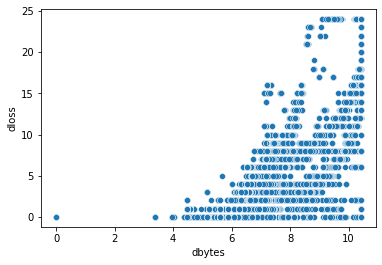

In [44]:
sns.scatterplot(x = 'dbytes', y = 'dloss', data = df_total); 

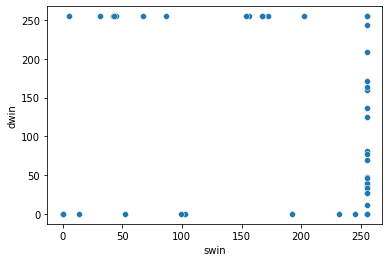

In [45]:
sns.scatterplot(x = 'swin', y = 'dwin', data = df_total);

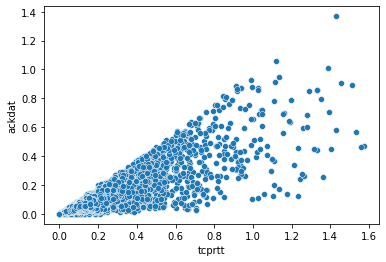

In [46]:
sns.scatterplot(x = 'tcprtt', y = 'ackdat', data = df_total);

# 3. Data Selection & Data Preparation

This is an important step in the machine learning process, we have to select a significant data subset then used to learn a model. Data selection is performed to raise the quality of machine learning models and to improve the performance of the models with new data. This could include missing or duplicate data removing, the deletion of useless features or the selection of a subset of the most important features. This step can also include the modification of the data distribution to make the model stable if the dataset is unbalanced.  

The data selection step can contain oversampling and undersampling methods. 

Oversampling consists in increasing the data quantity of a minority class within the dataset to guarantee a higher representability of that class. This step can be useful to prevent understimating machine learning model performance. 

Undersampling consists in the reduction of data quantità of a majority class within the dataset to stabilize the representation of different classes. This step can be useuful to prevent overstimating machine learning model performance.


The pre-elaboration phase is fundamental and should be executed both on the train and the test set. This phase consists in a serie of steps, like data cleaning (already performed), normalization, feature transformation and selection, that aim at improve the quality and the usability of the data to perform an automatic learning. 
It's important that both the train and the test set will be treated in the same manner, to avoid models either to be disadvantaged or to introduce inconsistencies. For example, if normalization is performed only on the train set, but not on the test set, test set values could not be represented correcly and negatively affect the model evaluation. 


TO DO oversampling, under sampling, e quindi balancing si fanno qui

# 3.1 Data Preparation

In [47]:
def create_count_df(col, data=df_total):
    df = pd.DataFrame(data[col].value_counts().reset_index().values, columns = [col, 'count'])
    df['percent'] = df['count'].values*100/data.shape[0]
    return df.sort_values(by='percent', ascending=False)

def corr(col1, col2='label', df=df_total):
    return pd.concat([df[col1], df[col2]], axis=1).corr().iloc[0,1]

### State

In [48]:
col = 'state'
# create_count_df(col, train) # to set the row below
df_total.loc[~df_total[col].isin(['FIN', 'INT', 'CON', 'REQ', 'RST']), col] = 'others'
create_count_df(col)

,state,count,percent
0,FIN,117164,45.470034
1,INT,116438,45.188281
2,CON,20134,7.813779
3,REQ,3833,1.487544
4,RST,84,0.032599
5,others,20,0.007762


### is_sm_ips_ports

C:\Users\Francesco\anaconda3\lib\site-packages\seaborn\axisgrid.py:156: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



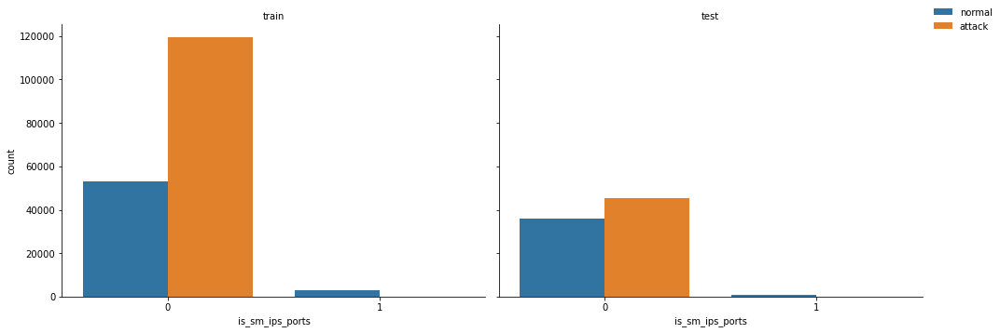

In [49]:
# is_sm_ips_ports, if it is 1 the connection is always normal
ax = sns.catplot(x='is_sm_ips_ports', hue="label", col="type", data=df_total, kind="count", height=5, legend=False, aspect=1.4)
ax.set_titles("{col_name}")
ax.add_legend(loc='upper right', labels=['normal','attack'])
plt.show(ax)

# TO DO le cose qui sotto sono ridondanti (log)

In [50]:
# df_total.drop(['sbytes', 'dbytes'], axis=1, inplace=True)

### smean & dmean

-0.0671864719700673 -0.5139070893491922 -0.06631920561325404 -0.5101996122103496


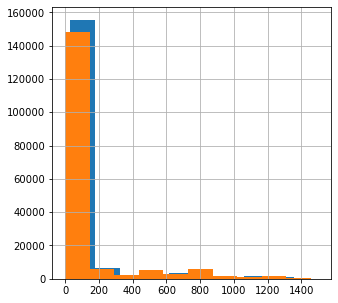

In [51]:
# the distributions are skewed to the left
train['smean'].hist(figsize=(5,5));
train['dmean'].hist(figsize=(5,5));
# we can drop smean and dmean after this computation
df_total['smean_log'] = df_total['smean'].apply(np.log1p)
df_total['dmean_log'] = df_total['dmean'].apply(np.log1p)
# we obtain a better correlation
print(corr('smean'), corr('dmean'), corr('smean_log'), corr('dmean_log'))

### spkts & dpkts

In [52]:
# also these features are skewed, drop them
df_total['spkts_log'] = df_total['spkts'].apply(np.log1p)
df_total['dpkts_log'] = df_total['dpkts'].apply(np.log1p)
print(corr('spkts'), corr('dpkts'), corr('spkts_log'), corr('dpkts_log'))

-0.35831740659051636 -0.46160125697656135 -0.34160931266498423 -0.47433262895791795


### sloss & dloss

In [53]:
df_total['sloss_log'] = df_total['sloss'].apply(np.log1p)
df_total['dloss_log'] = df_total['dloss'].apply(np.log1p)
print(corr('sloss'), corr('dloss'), corr('sloss_log'), corr('dloss_log'))

-0.3353937603143982 -0.34010352864809335 -0.3846237969529198 -0.3901697649655583


### stcpb & dtcpb

In [54]:
df_total['stcpb_log'] = df_total['stcpb'].apply(np.log1p)
df_total['dtcpb_log'] = df_total['dtcpb'].apply(np.log1p)
print(corr('stcpb'), corr('dtcpb'), corr('stcpb_log'), corr('dtcpb_log'))

-0.33899768755626575 -0.33836798055858464 -0.3395149825993979 -0.3391822630293557


### sinpkt & dinpkt

In [55]:
# sinpkt is highly correlated with is_sm_ips_ports, will dropping one of them benefit? TO DO check
df_total['sinpkt_log'] = df_total['sinpkt'].apply(np.log1p)
df_total['dinpkt_log'] = df_total['dinpkt'].apply(np.log1p)
print(corr('sinpkt'), corr('dinpkt'), corr('sinpkt_log'), corr('dinpkt_log'))

-0.13733517508533855 -0.07532955005161589 -0.1880120805985331 -0.12868708507007195


### sload & dload

In [56]:
df_total['sload_log'] = df_total['sload'].apply(np.log1p)
df_total['dload_log'] = df_total['dload'].apply(np.log1p)
print(corr('sload'), corr('dload'), corr('sload_log'), corr('dload_log'))

0.3421236563423625 -0.5897879773445802 0.2847932015407168 -0.5382399548992074


## 3.2 Feature Selection

Now the problem of dimensionality reduction is assessed. In particular it could be needed for:
- avoid the curse of dimensionality
- help in eliminating irrelevant features and reduce noise
- reduce time and space required
- allow easier visualization

This step is not always performed.

### Correlation based selection
First, we can drop the correlated features (see Correlatioin Analysis):

In [57]:
df_total.drop('sloss', axis=1, inplace=True)
df_total.drop('dbytes', axis=1, inplace=True)
df_total.drop('dwin', axis=1, inplace=True)
df_total.drop('synack', axis=1, inplace=True)
df_total.drop('ackdat', axis=1, inplace=True)
df_total.drop('is_ftp_login', axis=1, inplace=True)

### One-Hot Encoding

In [58]:
# Remove the first level of the categorical attribute, to avoid the so-called "dummy variable trap"
df_total_new = pd.get_dummies(df_total, columns=nominal_cols, drop_first=True) # one-hot encoding
dummy_variables = list(set(df_total_new) - set(df_total))
df_total = df_total_new
dummy_variables

# train_x = combined_df[combined_df['type'] == 'train']
# test_x = combined_df[combined_df['type'] == 'test']
# df_total.drop(['type'], axis=1, inplace=True)
# combined_df.drop(['type'], axis=1, inplace=True)
# train_x.drop(['type'], axis=1, inplace=True)
# test_x.drop(['type'], axis=1, inplace=True)

['proto_ip',
 'proto_srp',
 'proto_visa',
 'proto_pup',
 'proto_rtp',
 'state_REQ',
 'proto_sprite-rpc',
 'proto_vines',
 'proto_dgp',
 'proto_ipcv',
 'proto_zero',
 'proto_ospf',
 'proto_idrp',
 'proto_any',
 'proto_trunk-2',
 'proto_sat-expak',
 'proto_sep',
 'proto_ptp',
 'service_ssl',
 'proto_pipe',
 'proto_ipv6',
 'proto_xns-idp',
 'proto_egp',
 'proto_ipv6-frag',
 'proto_mux',
 'proto_qnx',
 'proto_icmp',
 'proto_isis',
 'proto_leaf-1',
 'proto_st2',
 'proto_pnni',
 'proto_igmp',
 'proto_iplt',
 'proto_smp',
 'proto_unas',
 'proto_ippc',
 'proto_idpr',
 'proto_mtp',
 'proto_aris',
 'proto_tlsp',
 'proto_dcn',
 'proto_a/n',
 'proto_compaq-peer',
 'proto_sm',
 'state_FIN',
 'proto_fire',
 'service_http',
 'proto_crudp',
 'service_ftp',
 'proto_sccopmce',
 'service_smtp',
 'service_dns',
 'proto_gmtp',
 'proto_ipx-n-ip',
 'proto_ib',
 'proto_pri-enc',
 'proto_tcp',
 'proto_netblt',
 'proto_mhrp',
 'state_INT',
 'state_RST',
 'proto_narp',
 'proto_crtp',
 'service_ftp-data',
 'proto

In [59]:
df_total.shape

(257673, 197)

In [60]:
# retrieve original datasets 
train = df_total[df_total['type'] == 'train']
train_len = len(train)
test = df_total[df_total['type'] == 'test']
test_len = len(test)

# splitting the train set
train_y_multi = train['attack_cat'] 
train_y_bin = train['label']
train_x_raw = train.drop(['attack_cat', 'label', 'type'], axis=1) 

# splitting the test set
test_y_multi = test['attack_cat']
test_y_bin = test['label']
test_x_raw = test.drop(['attack_cat', 'label', 'type'], axis=1)

In [61]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(['Normal', 'Fuzzers', 'Shellcode', 'DoS', 'Backdoor', 'Analysis', 'Generic', 'Reconnaissance', 'Exploits', 'Worms'])
# list(le.classes_)
train_y_multi = pd.Series(le.transform(train_y_multi))
test_y_multi = pd.Series(le.transform(test_y_multi))

In [62]:
# combined train and test set, without the ground truth
combined_df_raw = pd.concat([train_x_raw, test_x_raw])
combined_df_raw_y_bin = pd.concat([train_y_bin, test_y_bin])
combined_df_raw_y_multi = pd.concat([train_y_multi, test_y_multi])

In [63]:
# Feature selection: Chi2

best_features = SelectKBest(score_func=chi2, k='all')

fit_bin = best_features.fit(train_x_raw, train_y_bin)
# fit_multi = best_features.fit(train_x_raw, train_y_multi)

df_scores_bin = pd.DataFrame(fit_bin.scores_)
# df_scores_multi = pd.DataFrame(fit_multi.scores_)

df_cols = pd.DataFrame(train_x_raw.columns)

feature_score_bin = pd.concat([df_cols, df_scores_bin], axis=1)
feature_score_bin.columns=['feature','score']

# feature_score_multi = pd.concat([df_cols, df_scores_multi], axis=1)
# feature_score_multi.columns = ['feature', 'score']

feature_score_bin.sort_values(by=['score'], ascending=False, inplace=True)
# feature_score_multi.sort_values(by=['score'], ascending=False, inplace=True)

# same results
# print("Scores: \n")
print(feature_score_bin)
# print('\n\n Multiclass scores: \n')
# print(feature_score_multi)


# Scores: 

#               feature         score
# 17              stcpb  2.160697e+13
# 18              dtcpb  2.079258e+13
# 8               sload  2.832137e+12
# 9               dload  2.374350e+11
# 5                rate  5.743264e+09
# 4              dbytes  1.432230e+09
# 12             sinpkt  2.892880e+08
# 3              sbytes  2.089252e+08
# 26  response_body_len  1.096430e+08
# 15               djit  1.772847e+07
# 24              dmean  1.100826e+07
# 6                sttl  4.966079e+06
# 14               sjit  3.560351e+06
# 16               swin  2.707785e+06
# 19               dwin  2.507527e+06
# 2               dpkts  1.580336e+06
# 13             dinpkt  1.014482e+06
# 11              dloss  6.291405e+05
# 1               spkts  4.406746e+05
# 7                dttl  2.429885e+05
# 32     ct_dst_src_ltm  2.225998e+05
# 30   ct_src_dport_ltm  1.969422e+05
# 31   ct_dst_sport_ltm  1.779242e+05
# 37         ct_srv_dst  1.159385e+05
# 27         ct_srv_src  1.132542e+05
# 36         ct_src_ltm  9.906313e+04
# 29         ct_dst_ltm  9.700700e+04
# 28       ct_state_ttl  4.087154e+04
# 0                 dur  7.088066e+03
# 23              smean  6.262384e+03
# 38    is_sm_ips_ports  5.886069e+03
# 20             tcprtt  1.775311e+02
# 35   ct_flw_http_mthd  1.617428e+02
# 22             ackdat  1.338511e+02
# 25        trans_depth  1.164972e+02
# 10              sloss  6.319460e+01
# 21             synack  5.339926e+01
# 33       is_ftp_login  2.992649e+01
# 34         ct_ftp_cmd  2.277480e+01

            feature         score
5              sttl  4.966079e+06
14             swin  2.707785e+06
8             dload  3.987626e+05
9             dloss  3.327247e+05
6              dttl  2.429885e+05
..              ...           ...
0               dur  1.099913e+01
33        smean_log  2.997722e+00
135       proto_rtp  2.131089e+00
184  service_radius  1.287393e+00
185    service_smtp  1.205884e+00

[194 rows x 2 columns]


In [64]:
# Feature selection: Random Forest
importance_dict = {
    'feature': train_x_raw.columns
}

# on train data only, bin
clf_1 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_1.fit(train_x_raw, train_y_bin)
feature_importance_1 = clf_1.feature_importances_
importance_dict['train_bin'] = feature_importance_1

# on train data only, multi
clf_2 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_2.fit(train_x_raw, train_y_multi)
feature_importance_2 = clf_2.feature_importances_
importance_dict['train_multi'] = feature_importance_2

In [65]:
# ten-fold cross validation on train data, bin
from tqdm import notebook

feature_importances_bin = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_bin), total=10):
    x_train, y_train = train_x_raw.iloc[tr_idx], train_y_bin[tr_idx]
    clf_bin = RandomForestClassifier(n_jobs=-1)
    clf_bin.fit(x_train, y_train)
    
    feature_importances_bin.append(clf_bin.feature_importances_)
    
feature_importance_bin = np.mean(feature_importances_bin, axis=0)
importance_dict['train_10_fold_bin'] = feature_importance_bin

importance_df = pd.DataFrame(importance_dict)
for col in importance_df.columns:
    if col == 'feature':
        continue
    importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
# importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
# importance_df.sort_values('train_10_fold_bin', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

In [66]:
# ten-fold cross validation on train data, multi
feature_importances_multi = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_multi), total=10):
    x_train, y_train = train_x_raw.iloc[tr_idx], train_y_multi[tr_idx]
    clf_multi = RandomForestClassifier(n_jobs=-1)
    clf_multi.fit(x_train, y_train)
    
    feature_importances_multi.append(clf_multi.feature_importances_)
    
feature_importance_multi = np.mean(feature_importances_multi, axis=0)
importance_dict['train_10_fold_multi'] = feature_importance_multi

importance_df = pd.DataFrame(importance_dict)
for col in importance_df.columns:
    if col == 'feature':
        continue
    importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
importance_df.sort_values('train_10_fold_multi', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
3,sbytes,2.812413,7.569936,2.739048,6.119253,4.810162
31,ct_srv_dst,2.757342,4.539884,2.779641,5.773185,3.962513
5,sttl,11.870626,5.311183,9.267836,5.179305,7.907238
18,smean,2.476784,4.599460,2.055266,4.411259,3.385692
33,smean_log,2.225772,4.405066,2.141847,4.325498,3.274546
...,...,...,...,...,...,...
94,proto_ipnip,0.000072,0.001421,0.000030,0.001429,0.000738
74,proto_ggp,0.000019,0.001247,0.000024,0.001254,0.000636
117,proto_mux,0.004325,0.001333,0.001062,0.001201,0.001980
152,proto_st2,0.000043,0.000514,0.000775,0.001082,0.000604


In [67]:
importance_df = importance_df.sort_values('mean', ascending=False)

In [68]:
importance_df

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
5,sttl,11.870626,5.311183,9.267836,5.179305,7.907238
23,ct_state_ttl,9.395086,4.039892,8.729695,3.332360,6.374258
3,sbytes,2.812413,7.569936,2.739048,6.119253,4.810162
31,ct_srv_dst,2.757342,4.539884,2.779641,5.773185,3.962513
44,dload_log,4.655260,2.576310,4.517673,2.424505,3.543437
...,...,...,...,...,...,...
173,proto_xnet,0.000055,0.001368,0.000075,0.002083,0.000895
94,proto_ipnip,0.000072,0.001421,0.000030,0.001429,0.000738
74,proto_ggp,0.000019,0.001247,0.000024,0.001254,0.000636
152,proto_st2,0.000043,0.000514,0.000775,0.001082,0.000604


The results are pretty different, i decided to maintain both of them and analyse the results. 

In [69]:
irrelevant_features_chi2 = list(feature_score_bin['feature'].iloc[30:])
irrelevant_features_rf = list(importance_df['feature'].iloc[30:])
irrelevant_features = list(set(irrelevant_features_rf).union(set(irrelevant_features_chi2)))
irrelevant_features

['proto_ip',
 'proto_srp',
 'proto_visa',
 'proto_rtp',
 'proto_zero',
 'dloss_log',
 'proto_ospf',
 'proto_idrp',
 'proto_any',
 'dpkts',
 'proto_trunk-2',
 'sloss_log',
 'proto_ptp',
 'service_ssl',
 'proto_ipv6',
 'proto_egp',
 'proto_icmp',
 'proto_isis',
 'proto_leaf-1',
 'proto_smp',
 'sload_log',
 'proto_ippc',
 'dur',
 'proto_idpr',
 'proto_mtp',
 'proto_compaq-peer',
 'proto_a/n',
 'proto_sm',
 'service_ftp',
 'response_body_len',
 'service_dns',
 'proto_pri-enc',
 'state_RST',
 'proto_netblt',
 'proto_narp',
 'service_ftp-data',
 'proto_merit-inp',
 'proto_swipe',
 'proto_ipnip',
 'proto_etherip',
 'dloss',
 'proto_micp',
 'service_snmp',
 'proto_wb-expak',
 'proto_br-sat-mon',
 'service_pop3',
 'proto_ipip',
 'stcpb',
 'proto_kryptolan',
 'proto_hmp',
 'proto_tp++',
 'service_irc',
 'ct_flw_http_mthd',
 'proto_secure-vmtp',
 'proto_pim',
 'proto_sctp',
 'service_radius',
 'dtcpb_log',
 'state_others',
 'proto_trunk-1',
 'proto_xnet',
 'proto_chaos',
 'proto_iatp',
 'proto_ig

In [70]:
train_reduced = train_x_raw.drop(labels=irrelevant_features, axis=1)
test_reduced = test_x_raw.drop(labels=irrelevant_features, axis=1)
train_reduced.shape

(175341, 19)

In [71]:
# TEST TO DO remove 
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_reduced, train_y_bin)
pred_y_bin = classifier.predict(test_reduced)
print(classification_report(test_y_bin, pred_y_bin))

              precision    recall  f1-score   support

           0       0.92      0.74      0.82     37000
           1       0.82      0.95      0.88     45332

    accuracy                           0.86     82332
   macro avg       0.87      0.85      0.85     82332
weighted avg       0.86      0.86      0.85     82332



------------------------------------

TO DO add some data visualization here ???

## 3.3 Normalization
**Observation**: 
The distributions of each feature vary widely, this will affect our results if we use any distance-based methods for classification. 
For instance, the mean of `sload` is larger than the mean of `dur` by seven orders of magnitude, and its standard deviation is larger by eight orders of magnitude.

Without performing feature value normalization, the `sload` feature would dominate, causing the model to miss out on potentially important information in the `dur` feature. We need to rescale the value. 

This step is usually applied to both the training and test data. The purpose of standardization is to transform the data so that it has a mean of zero and a standard deviation of one. This is done so that the data has a common scale, which is important for many machine learning algorithms that use distance metrics or assume a Gaussian distribution of the input features. By standardizing both the training and test data using the same statistics (mean and standard deviation) computed from the training data, we ensure that the test data is transformed in the same way as the training data and the results are comparable.

In [72]:
train_reduced.describe()

,rate,sttl,dttl,sload,dload,sjit,djit,dmean,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,dmean_log,dpkts_log,dload_log
count,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000
mean,7.832510,179.546997,79.609567,13.888429,5.576798,3.440841,2.204748,2.491163,9.126513,1.304179,5.841155,5.047108,4.145226,8.549997,6.574406,8.924769,0.905287,0.648647,1.264477
std,4.119026,102.940011,110.506863,4.615560,5.718699,3.823323,2.724242,2.504550,10.190476,0.954406,6.922349,6.939599,5.589185,10.445807,7.176324,10.255343,0.879051,0.651058,1.227953
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,3.520051,62.000000,0.000000,9.476876,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000
50%,8.079248,254.000000,29.000000,13.687308,7.277954,0.000000,0.000000,3.806662,5.000000,1.000000,2.000000,1.000000,1.000000,3.000000,3.000000,4.000000,1.570003,0.741276,2.113596
75%,11.736077,254.000000,252.000000,18.302898,10.234440,7.829748,4.753510,4.499810,12.000000,2.000000,7.000000,5.000000,3.000000,12.000000,9.000000,12.000000,1.704713,1.223156,2.418984
max,12.716901,255.000000,254.000000,19.401510,15.193128,9.162146,7.929434,6.646910,34.000000,6.000000,25.000000,25.000000,17.000000,34.000000,25.000000,34.000000,2.034302,1.637663,2.784587


The chosen scaler is RobustScaler because of its capability of maintaining small differences in the distributions, especially for outliers. In terms of classification accuracy the transformations below are quite similar, thus StandardScaled was picked. 

In [73]:
# from sklearn.preprocessing import StandardScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# ss = StandardScaler()
# train_reduced[numeric_cols] = ss.fit_transform(train_reduced[numeric_cols])
# test_reduced[numeric_cols] = ss.transform(test_reduced[numeric_cols])

In [74]:
# from sklearn.preprocessing import RobustScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# rs = RobustScaler().fit(train_reduced[numeric_cols]);
# train_reduced[numeric_cols] = rs.transform(train_reduced[numeric_cols]);
# test_reduced[numeric_cols] = rs.transform(test_reduced[numeric_cols]);

In [75]:
from sklearn.preprocessing import MinMaxScaler
numeric_cols = train_reduced.select_dtypes(exclude='object').columns
mms = MinMaxScaler()
train_reduced[numeric_cols] = mms.fit_transform(train_reduced[numeric_cols])
test_reduced[numeric_cols] = mms.transform(test_reduced[numeric_cols])

In [76]:
train_reduced.describe()

,rate,sttl,dttl,sload,dload,sjit,djit,dmean,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,dmean_log,dpkts_log,dload_log
count,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000
mean,0.615822,0.704106,0.313423,0.716008,0.367073,0.375553,0.278044,0.374785,0.246258,0.217363,0.201715,0.168630,0.196577,0.228788,0.232267,0.240145,0.445011,0.396081,0.454118
std,0.323962,0.403686,0.435066,0.237910,0.376671,0.417426,0.343412,0.376799,0.308802,0.159068,0.288431,0.289150,0.349324,0.316540,0.299014,0.310768,0.432114,0.397553,0.441213
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.276801,0.243137,0.000000,0.488461,0.000000,0.000000,0.000000,0.000000,0.030303,0.166667,0.000000,0.000000,0.000000,0.000000,0.041667,0.030303,0.000000,0.000000,0.000000
50%,0.635316,0.996078,0.114173,0.705476,0.479029,0.000000,0.000000,0.572697,0.121212,0.166667,0.041667,0.000000,0.000000,0.060606,0.083333,0.090909,0.771765,0.452643,0.759034
75%,0.922872,0.996078,0.992126,0.943375,0.673623,0.854576,0.599477,0.676978,0.333333,0.333333,0.250000,0.166667,0.125000,0.333333,0.333333,0.333333,0.837985,0.746891,0.868705
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [77]:
train_x = train_reduced
test_x = test_reduced

They all produce very similar results. 

TO DO add some data visualization here ???

# 4. Data Modelling (Classification)

**Why classification and not anomaly detection?**

Classification and anomaly detection are two different machine learning tasks.

**Classification** involves assigning a predefined class or category to a new instance based on its features. For example, classify a new email as spam or not spam.

**Anomaly detection**, on the other hand, involves detecting instances that are different from the norm in the data. For example, detecting fraudulent transactions in a set of financial transactions.

In summary, classification divides data into predefined categories, while anomaly detection identifies instances that are outside of the norm.

TO DO also explain the binary problem

We have a ten-class classification problem in which each sample belongs to one of the following classes: `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, `Reconnaissance`, `Shellcode`, `Worms` and `Normal`. There are many different classification algorithms suitable for a problem like this, and many different ways to approach the problem of multiclass classification. Many classification algorithms inherently supprot multiclass data (e.g., decision trees, nearest neighbors, Naive Bayes), whereas other do not (e.g., support vector machines). Even if our algorithm of choice does not inherently support multiple classes, there are some clever techniques for effectively achieving this. 

TO DO remove? 
Essentially, a multiclass problem can be split into multiple binary classification problems. A strategy known as *one-versus-all*, also called *binary relevance method*, fits one classifier per class, with data belonging to the class fitted against the aggregate of all other classes. Another less commonly used strategy is *one-versus-one*, in which there are *n_classes * (n_classes - 1) / 2* classifier constructed, one for each unique pair of classes. In this case, during the prediction phase, each sample is run through all the classifiers, and the classification confidences for each of the classes are tallied. The class with the highest aggregate confidence is selectedd as the prediction result. 
One-versus-all scales linearly with the number of class and, in general, has better model interpretability because each class is only represented by one classifier (as opposed to each class being represented by *n_class - 1* classifiers for one-versus-one). TO DO remove below??? In contrast, the one-versus-one strategy does not scale well with the number of classes because of its polynomial complexity. 

## 4.1 Supervised Learning

### Decision Tree

#### Binary classification

In [78]:
# Visualization purposes
# We start with a small max_depth so we can look at the decision tree structure in a friendly way
classifier = DecisionTreeClassifier(max_depth=7)
classifier = classifier.fit(train_x, train_y_bin)
print(f"double check shapes: X.shape = {train_x.shape}, y.shape = {train_y_bin.shape}")
print(f"model classes: {classifier.classes_}")

double check shapes: X.shape = (175341, 19), y.shape = (175341,)
model classes: [0 1]


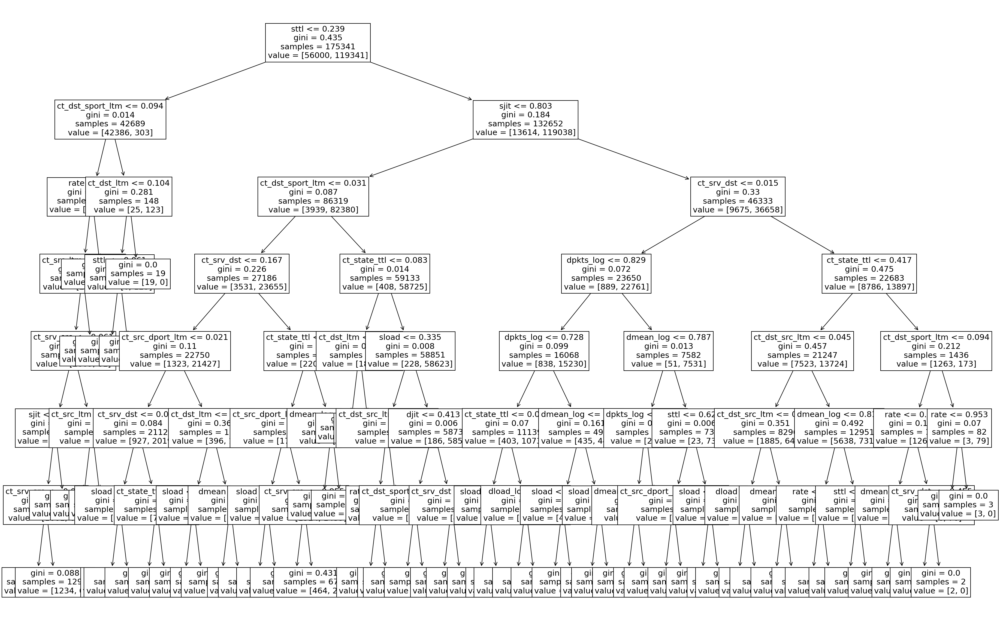

In [79]:
from sklearn import tree
plt.figure(figsize=(30, 20), dpi=150)
tree.plot_tree(classifier, feature_names = train_x.columns, fontsize=14)
plt.show()

In [80]:
# various combinations of the parameters were tried, in particular max_depth=8 is optimal
# for example, max_depth= 10 with '30' features gives the same result, but worst performance
# random_state is set to an integer to obtain a deterministic behaviour in fitting
classifier = DecisionTreeClassifier(criterion='gini', random_state=0, max_depth=8, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x, train_y_bin)

See if pruning is necessary (spoiler, no):

In [81]:
path = classifier.cost_complexity_pruning_path(train_x, train_y_bin)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

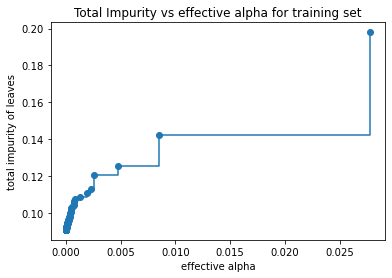

In [82]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [83]:
# ccp_alphas = ccp_alphas[ccp_alphas >= 0.]

In [84]:
ccp_alphas.shape

(99,)

In [85]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(train_x, train_y_bin)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.3020027359559398


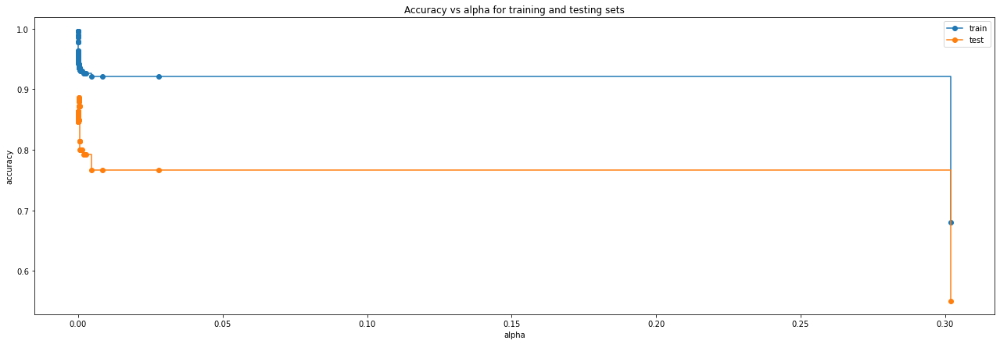

In [86]:
train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

fig, ax = plt.subplots(figsize=(22,7))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [87]:
pred_y_bin = classifier.predict(test_x)

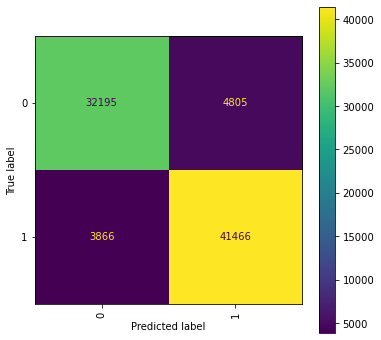

In [88]:
fig, ax = plt.subplots(figsize=(6, 6))
disp = ConfusionMatrixDisplay.from_predictions(test_y_bin, pred_y_bin, xticks_rotation='vertical', ax=ax)
plt.show()

In [89]:
print(classification_report(test_y_bin, pred_y_bin))

              precision    recall  f1-score   support

           0       0.89      0.87      0.88     37000
           1       0.90      0.91      0.91     45332

    accuracy                           0.89     82332
   macro avg       0.89      0.89      0.89     82332
weighted avg       0.89      0.89      0.89     82332



### TO DO comments

### Multiclass and Imbalance Problem

In [90]:
tree_multi = DecisionTreeClassifier(criterion='gini', random_state=0, ccp_alpha=0)
tree_multi = tree_multi.fit(train_x, train_y_multi)
pred_y_multi = tree_multi.predict(test_x)

In [91]:
# path = tree_multi.cost_complexity_pruning_path(train_x, train_y_multi)
# ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [92]:
# fig, ax = plt.subplots()
# ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
# ax.set_xlabel("effective alpha")
# ax.set_ylabel("total impurity of leaves")
# ax.set_title("Total Impurity vs effective alpha for training set")

In [93]:
# ccp_alphas = ccp_alphas[ccp_alphas > 0]
# ccp_alphas

In [94]:
# clfs = []
# # i = 0
# for ccp_alpha in ccp_alphas:
#     clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
#     clf.fit(train_x, train_y_bin)
#     clfs.append(clf)
# #     print(i)
# #     i += 1
# print(
#     "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
#         clfs[-1].tree_.node_count, ccp_alphas[-1]
#     )
# )

In [95]:
# train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
# test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

# fig, ax = plt.subplots(figsize=(20,10))
# ax.set_xlabel("alpha")
# ax.set_ylabel("accuracy")
# ax.set_title("Accuracy vs alpha for training and testing sets")
# ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
# ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
# ax.legend()
# plt.show()

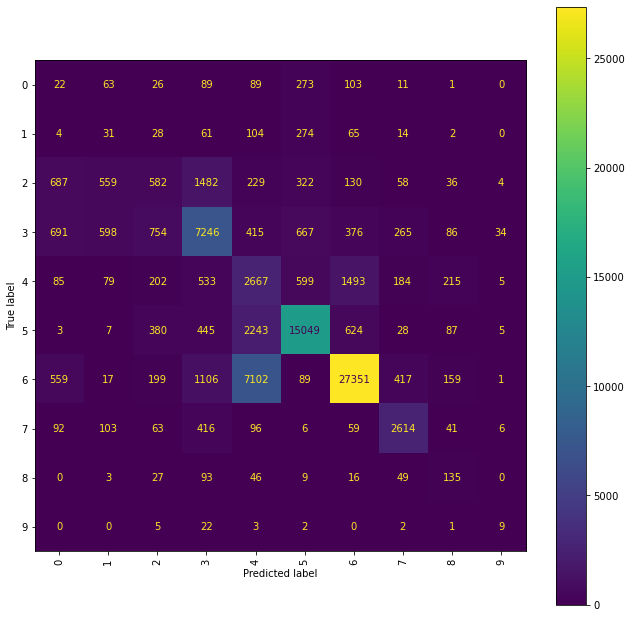

In [96]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y_multi, xticks_rotation='vertical', ax=ax)
plt.show()

In [97]:
print(classification_report(test_y_multi, pred_y_multi))

              precision    recall  f1-score   support

           0       0.01      0.03      0.02       677
           1       0.02      0.05      0.03       583
           2       0.26      0.14      0.18      4089
           3       0.63      0.65      0.64     11132
           4       0.21      0.44      0.28      6062
           5       0.87      0.80      0.83     18871
           6       0.91      0.74      0.81     37000
           7       0.72      0.75      0.73      3496
           8       0.18      0.36      0.24       378
           9       0.14      0.20      0.17        44

    accuracy                           0.68     82332
   macro avg       0.39      0.42      0.39     82332
weighted avg       0.75      0.68      0.71     82332



With just a few lines of code and no tuning at all, a decent classification accuracy is obtained. However, this number is quite meaningless without considering the distribution of the test set (shown below). We know that such a measure is not acceptable for an unbalanced dataset, because we are interested in the *minority* class. If we take a look at some other measure like the **precision** (percentage of tuples labeled as positive and actually such, *TP/(TP+FP)*) and the **recall**  (percentage of positive tuples labeled as such, *TP/P*) the results are not very good. For example, the 'Analysis' attack category has a precision = 2% and a recall = 9%. 
A good parameter to look at is the F1-Score, e.g. an harmonic mean of precision and recall.

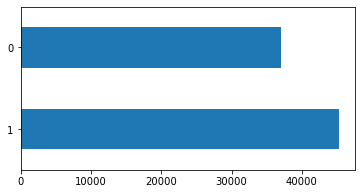

In [98]:
test_attack_cats = test_y_bin.value_counts()
test_attack_cats.plot(kind='barh', figsize=(6,3), fontsize=10);

In the confusion matrix, the diagonal values are the counts of the correctly classified samples. Each row represents the true class, and each column represents the predicted class. For instance, the number in the second row and in third column represents the number of samples that are actually of class `Backdoor` that were classfied as `DoS`.

Simlarly to the training set, the test distribution is not balanced across categories:

In [99]:
test_y_multi.value_counts().apply(lambda x: (x / float(len(test_y_multi))*100))

6    44.939999
5    22.920614
3    13.520867
4     7.362872
2     4.966477
7     4.246223
0     0.822281
1     0.708109
8     0.459117
9     0.053442
dtype: float64

We see that the 44% of the test data belong to the `Normal` class, 23% to the `Generic` one, 14% to `Exploits`, 7% to `Fuzzers`, whereas only the 0,005% of the data belongs to the `Worms` class, the 0,04% belongs to the `Shellcode`, 0,07% to `Backdoor` and 0,08% to `Analysis`. We can see the problem in the `Shellcode` row for example, the number of times it is correctly classified is similar to the number of times it is wrongly classified. It could have been not enough information for the trained model to learn from the latter classes to correctly identify them. We must face the problem of class imbalance. 

### Sampling

As we know, there are two possible remedies: undersampling (e.g., prioritize the removal of samples that are very similar to other samples that will remain in the dataset) and oversampling (e.g., generate synthetic data points for minority classes using SMOTE). A popular method is to first oversample the minority class and then undersample to tighten the class distribution discrepancy. 

In [100]:
print(pd.Series(train_y_multi).value_counts())

6    56000
5    40000
3    33393
4    18184
2    12264
7    10491
0     2000
1     1746
8     1133
9      130
dtype: int64


In [101]:
# !pip install imblearn

In [102]:
from imblearn.over_sampling import SMOTE

mean_class_size = int(pd.Series(train_y_multi).value_counts().sum() / 10)

# a lot of values were tried
strategy = { 
            #'Fuzzers': mean_class_size, 
            2: 40000, # DoS
            0: 40000, # Analysis
            1: 40000, # Backdoor
            8: 40000, # Shellcode
            9: 40000  # Worms
           }

sm = SMOTE(sampling_strategy = strategy, random_state = 0)
train_x_sm, train_y_sm = sm.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_sm).value_counts())


6    56000
1    40000
0    40000
8    40000
2    40000
9    40000
5    40000
3    33393
4    18184
7    10491
dtype: int64


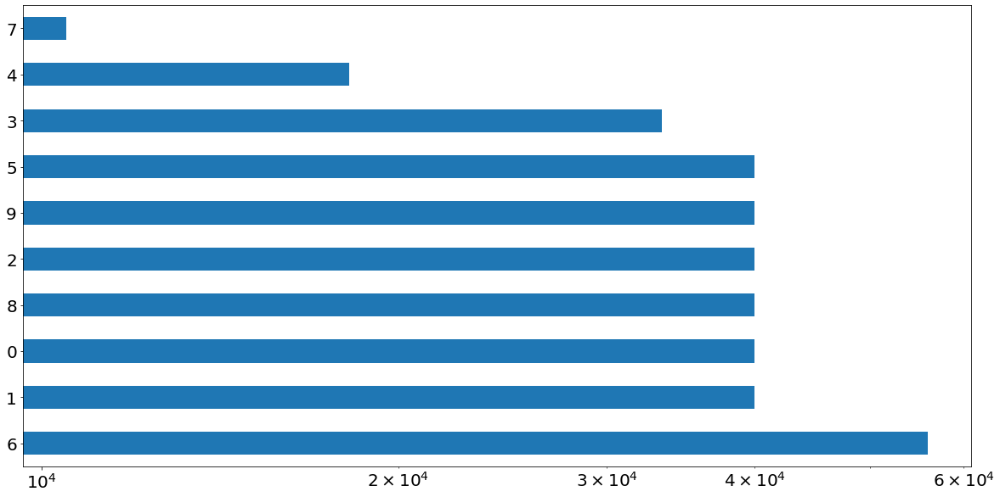

In [103]:
test_attack_cats = train_y_sm.value_counts()
test_attack_cats.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

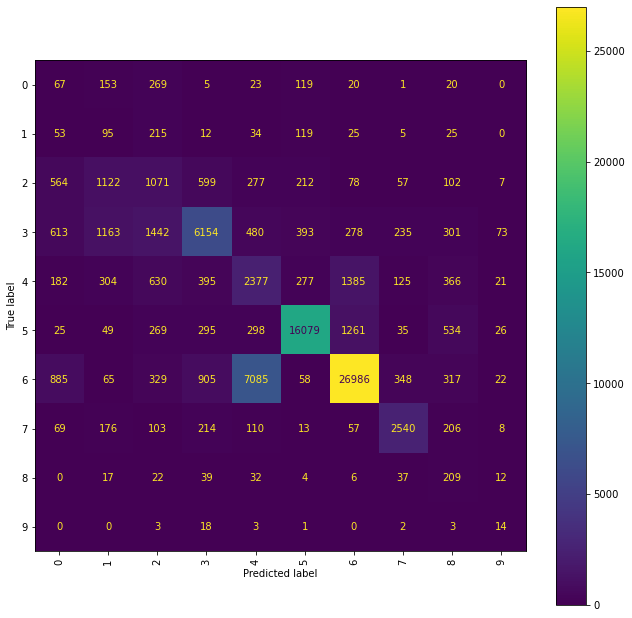

              precision    recall  f1-score   support

           0       0.03      0.10      0.04       677
           1       0.03      0.16      0.05       583
           2       0.25      0.26      0.25      4089
           3       0.71      0.55      0.62     11132
           4       0.22      0.39      0.28      6062
           5       0.93      0.85      0.89     18871
           6       0.90      0.73      0.80     37000
           7       0.75      0.73      0.74      3496
           8       0.10      0.55      0.17       378
           9       0.08      0.32      0.12        44

    accuracy                           0.68     82332
   macro avg       0.40      0.46      0.40     82332
weighted avg       0.77      0.68      0.72     82332



In [104]:
# OVERFITTING CHECK (commented because time-consuming, also tried with classification_report)
# values = [i for i in range(10, 25)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm, train_y_sm)
#     pred_yt = classifier.predict(test_x)
#     print(accuracy_score(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm)
#     print(accuracy_score(train_y_sm, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(criterion='gini', random_state=0, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x_sm, train_y_sm)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()
print(classification_report(test_y_multi, pred_y))

We can see an overfitting problem after a depth of 16 levels, thanks to the loop test. This is why we set max_depth to 16. 

TO DO correct Here a lot of experimentation can be made: my idea was to try first SMOTE to all the minority classes with a sampling set to *mean_class_size*, then SMOTE to all the minority classes with the strategy set to *auto*, then some experimentation mixing these values. For example, applying SMOTE only to those features with an F-score less than 0.50, or do the latter but adding also those features that worsen their measures (like Worms), and something similar. I found that the best, worst, solution is applying SMOTE to all those features with an F-score less than 50%. When I evaluated these combinations I evaluated the total sum of the F-scores of all the features. When I said best/worst is because the relative solution is in any case worst with respect to the base one without over-sampling. 

Let's see what happens applying also under-sampling:

In [105]:
print(pd.Series(train_y_sm).value_counts())

6    56000
1    40000
0    40000
8    40000
2    40000
9    40000
5    40000
3    33393
4    18184
7    10491
dtype: int64


In [106]:
from imblearn.under_sampling import RandomUnderSampler

# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

rus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_sm_rus, train_y_sm_rus = rus.fit_resample(train_x_sm, train_y_sm)
print(pd.Series(train_y_sm_rus).value_counts())

0    40000
1    40000
2    40000
8    40000
9    40000
4    18184
3    17534
5    17534
6    17534
7    10491
dtype: int64


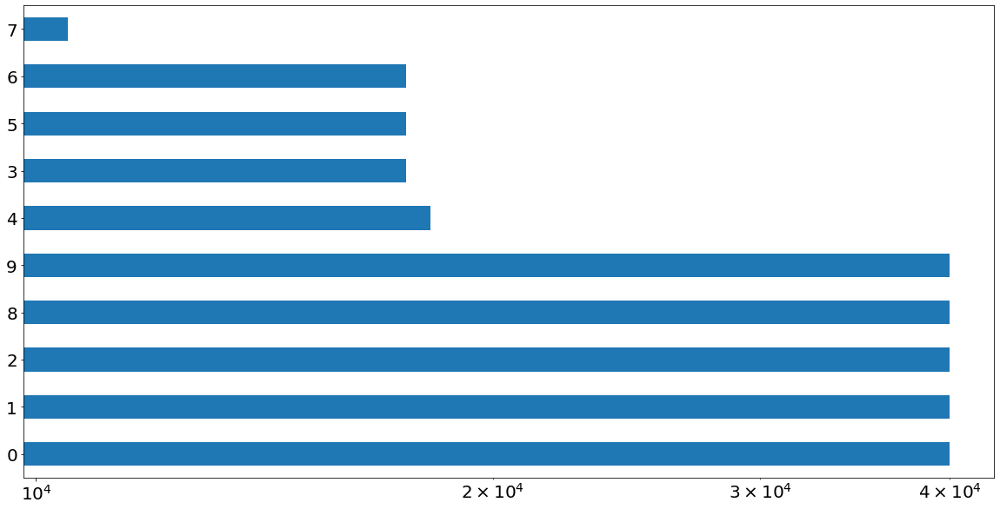

In [107]:
test_attack_cats_sm_rus = train_y_sm_rus.value_counts()
test_attack_cats_sm_rus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

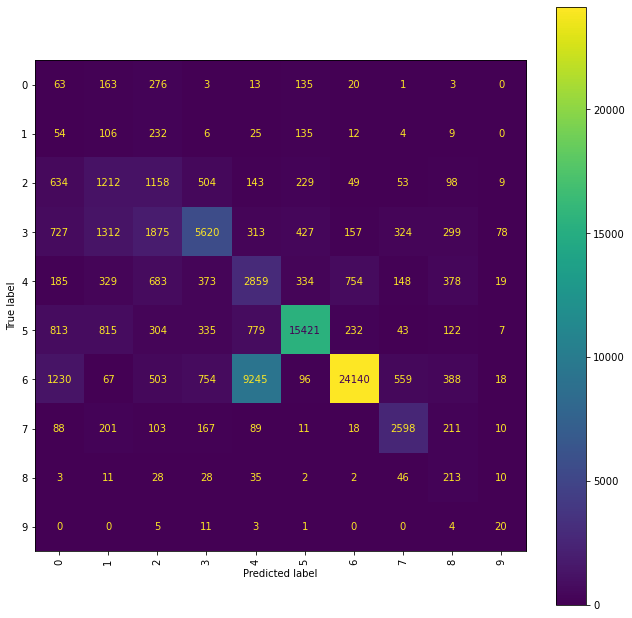

In [108]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm_rus)
#     print(classification_report(train_y_sm_rus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [109]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.02      0.09      0.03       677
           1       0.03      0.18      0.04       583
           2       0.22      0.28      0.25      4089
           3       0.72      0.50      0.59     11132
           4       0.21      0.47      0.29      6062
           5       0.92      0.82      0.86     18871
           6       0.95      0.65      0.77     37000
           7       0.69      0.74      0.71      3496
           8       0.12      0.56      0.20       378
           9       0.12      0.45      0.19        44

    accuracy                           0.63     82332
   macro avg       0.40      0.48      0.40     82332
weighted avg       0.79      0.63      0.69     82332



Also here, some experimentation has been done. We can notice that the scores change a bit for some features but basically their sum remains the same. 

Our last chance is to perform only undersampling:

In [110]:
# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

orus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_orus, train_y_orus = orus.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_orus).value_counts())

4    18184
3    17534
5    17534
6    17534
2    12264
7    10491
0     2000
1     1746
8     1133
9      130
dtype: int64


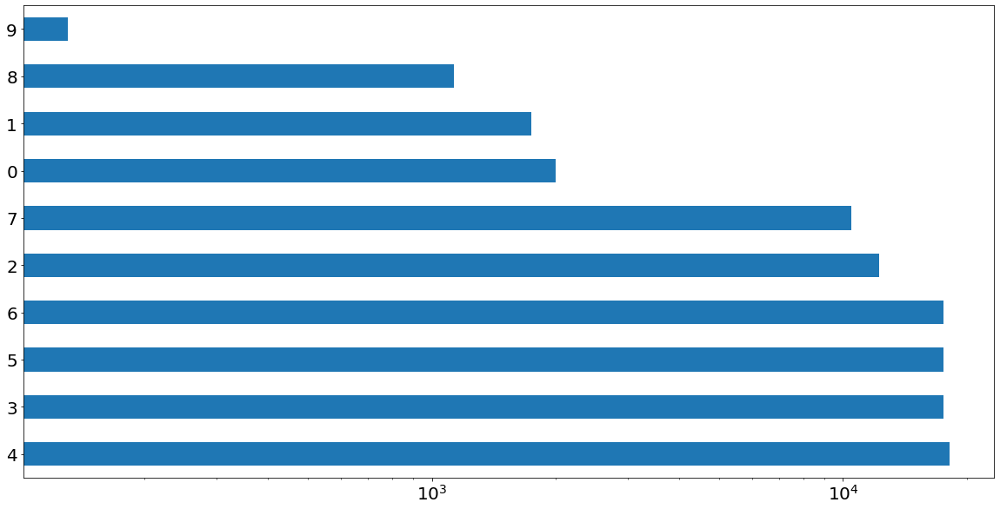

In [111]:
test_attack_cats_orus = train_y_orus.value_counts()
test_attack_cats_orus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

In [112]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_orus, train_y_orus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_orus)
#     print(classification_report(train_y_orus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_orus, train_y_orus)
pred_y = classifier.predict(test_x)

In [113]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.01      0.04      0.02       677
           1       0.03      0.07      0.04       583
           2       0.29      0.35      0.32      4089
           3       0.69      0.56      0.62     11132
           4       0.18      0.54      0.28      6062
           5       0.93      0.69      0.80     18871
           6       0.90      0.66      0.77     37000
           7       0.66      0.78      0.71      3496
           8       0.16      0.42      0.23       378
           9       0.12      0.23      0.16        44

    accuracy                           0.63     82332
   macro avg       0.40      0.43      0.39     82332
weighted avg       0.77      0.63      0.68     82332



Also in this case some experiments have been done, but the point remains the same, we can get some better behaviour in classifying some minority classes but with no such a general great improvement. 
We can conclude that some features like *Analysis* and *Backdoors* probably do not have a suitable fingerprint on the network statistics, because even raising up their instances, making them the majority classes (e.g., first oversample them to the max, and then undersample the other major categories), makes a little difference on their metrics. Another possible reason is the nature of the data that were sampled when the dataset was created. 
Furthermore, the unbalanced multiclass classification problem is hard to solve.

In the following i decided to apply the **stratified K fold cross validation** to choose the right sampling to maintain (spoiler: the application of both SMOTE and RandomUnderSampling). 

In [114]:
# compute average per-class metrics  
def computeAverageMetrics(df_list):
    df_concat = pd.concat(df_list)
    grouped_by_row_index = df_concat.groupby(df_concat.index)
    df_avg = grouped_by_row_index.mean()
    df_avg.transpose()
    return df_avg

# compute average accuracy
def computeAverageAccuracy(accuracy_list):
    accuracy_avg = np.mean(accuracy_list)
    print("Average Accuracy score == {:.2f} %".format(accuracy_avg*100))
    
# compute average F1-score
def computeAverageF1Score(avg_df):
    f1_avg = avg_df.transpose()['f1-score'].mean()
    print("Average F1-score == {:.2f} %".format(f1_avg*100))

In [121]:
# this is preferred for the multi problem (stratified)
# this is not extremely necessary because the test set is not too small
# but is preferred considering the unbalanced nature of the dataset

from sklearn.metrics import RocCurveDisplay, auc


def applyStratifiedKFold(classifier, multi):
    skf = StratifiedKFold(n_splits=10, shuffle=True)
    
    df_all = pd.concat([train_x, test_x], axis=0)

    if not multi:
        gt_all = pd.concat([train_y_bin, test_y_bin], axis=0)
    else: 
        gt_all = pd.concat([train_y_multi, test_y_multi], axis=0)
    
    list_df = []
    list_accuracy = []

    
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    
    fig, ax = plt.subplots(figsize=(6, 6))
    k = 1
    for train_idx, test_idx in skf.split(df_all, gt_all):

        print(f'FOLD {k}:')

        # fit and predict using classifier
        x_tr = df_all.iloc[train_idx]
        y_tr = gt_all.iloc[train_idx]
        x_test = df_all.iloc[test_idx]
        y_test = gt_all.iloc[test_idx]

        clf = classifier
        clf.fit(x_tr, y_tr)
        y_pred = clf.predict(x_test)
        
        if not multi:
            viz = RocCurveDisplay.from_estimator(
                clf,
                x_test,
                y_test,
                name=f"ROC fold {k}",
                alpha=0.3,
                lw=1,
                ax=ax
                # plot_chance_level=(k == 10 - 1),
                )
            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)

        # compute classification report
        cr = classification_report(y_test, y_pred, output_dict = True)

        # store accuracy
        list_accuracy.append(cr['accuracy'])

        # store per-class metrics as a dataframe
        df = pd.DataFrame({k:v for k,v in cr.items() if k != 'accuracy'})
        display(df)
        list_df.append(df)
        k += 1
        print("")
    
    if not multi:
        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        ax.plot(
            mean_fpr,
            mean_tpr,
            color="b",
            label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
            lw=2,
            alpha=0.8,
        )

        std_tpr = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
        tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
        ax.fill_between(
            mean_fpr,
            tprs_lower,
            tprs_upper,
            color="grey",
            alpha=0.2,
            label=r"$\pm$ 1 std. dev.",
        )

        ax.set(
            xlim=[-0.05, 1.05],
            ylim=[-0.05, 1.05],
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
            title="Mean ROC curve with variability)",
        )
        ax.axis("square")
        ax.legend(loc="lower right")
        plt.show()

    return list_df, list_accuracy


#### binary cross validation

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.906589,0.947404,0.926996,0.932673
recall,0.906882,0.947231,0.927056,0.932668
f1-score,0.906735,0.947317,0.927026,0.932671
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.906206,0.945222,0.925714,0.931141
recall,0.902796,0.947231,0.925013,0.931194
f1-score,0.904498,0.946225,0.925362,0.931165
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.901963,0.948457,0.925210,0.931677
recall,0.909140,0.944195,0.926667,0.931543
f1-score,0.905537,0.946321,0.925929,0.931602
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.900532,0.948464,0.924498,0.931164
recall,0.909247,0.943281,0.926264,0.930997
f1-score,0.904869,0.945865,0.925367,0.931069
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.901752,0.944667,0.923210,0.929178
recall,0.902043,0.944495,0.923269,0.929173
f1-score,0.901898,0.944581,0.923239,0.929175
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.905014,0.943984,0.924499,0.929918
recall,0.900538,0.946621,0.923579,0.929988
f1-score,0.902770,0.945300,0.924035,0.929950
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.901758,0.948907,0.925333,0.931890
recall,0.910000,0.944009,0.927005,0.931734
f1-score,0.905860,0.946452,0.926156,0.931801
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.903054,0.950275,0.926665,0.933232
recall,0.912473,0.944677,0.928575,0.933054
f1-score,0.907739,0.947468,0.927604,0.933129
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.900021,0.948275,0.924148,0.930859
recall,0.908925,0.942977,0.925951,0.930687
f1-score,0.904451,0.945618,0.925035,0.930760
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.903378,0.946722,0.925050,0.931078
recall,0.905806,0.945285,0.925545,0.931036
f1-score,0.904591,0.946003,0.925297,0.931056
support,9300.000000,16467.000000,25767.000000,25767.000000


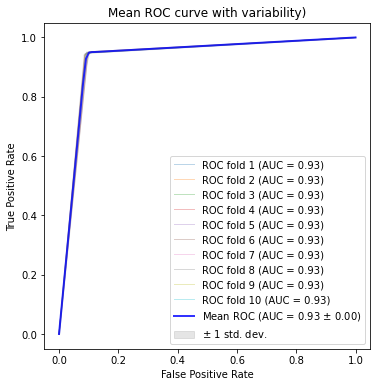

In [116]:
dt_bin = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy_dt = applyStratifiedKFold(dt_bin, 0)

In [117]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.904895,0.903027,0.906785,9300.0
1,0.946115,0.947238,0.945000,16467.3
macro avg,0.925505,0.925132,0.925893,25767.3
weighted avg,0.931238,0.931281,0.931207,25767.3


In [118]:
computeAverageAccuracy(list_accuracy_dt)

Average Accuracy score == 93.12 %


In [119]:
computeAverageF1Score(df_avg)

Average F1-score == 92.69 %


#### multiclass cross validation

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.047431,0.017527,0.277815,0.810099,0.623275,0.985136,0.904952,0.812290,0.316964,0.193548,0.498904,0.814666
recall,0.134328,0.154506,0.251988,0.497193,0.558763,0.979446,0.901935,0.690272,0.470199,0.333333,0.497196,0.747012
f1-score,0.070107,0.031482,0.264272,0.616198,0.589259,0.982283,0.903441,0.746326,0.378667,0.244898,0.482693,0.773081
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.043646,0.014177,0.277382,0.815027,0.603125,0.984911,0.907275,0.826389,0.257009,0.178571,0.490751,0.814714
recall,0.126866,0.120172,0.261774,0.511565,0.557113,0.975709,0.898495,0.680973,0.364238,0.277778,0.477468,0.746313
f1-score,0.064947,0.025362,0.269352,0.628587,0.579207,0.980288,0.902863,0.746667,0.301370,0.217391,0.471604,0.773371
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.053476,0.014911,0.269032,0.813299,0.609734,0.981681,0.908177,0.821699,0.261803,0.166667,0.490048,0.813988
recall,0.149254,0.133047,0.255046,0.499888,0.558168,0.973845,0.893333,0.698856,0.401316,0.235294,0.479805,0.743209
f1-score,0.078740,0.026817,0.261852,0.619193,0.582813,0.977747,0.900694,0.755315,0.316883,0.195122,0.471518,0.770969
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.050258,0.011558,0.285226,0.827976,0.639768,0.986964,0.913356,0.826383,0.242798,0.200000,0.498429,0.823570
recall,0.145522,0.098712,0.255046,0.526387,0.591997,0.977408,0.902258,0.694067,0.390728,0.352941,0.493507,0.754415
f1-score,0.074713,0.020693,0.269293,0.643602,0.614956,0.982163,0.907773,0.754468,0.299492,0.255319,0.482247,0.782051
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.043367,0.014392,0.275976,0.811871,0.620124,0.984581,0.914471,0.809924,0.252874,0.230769,0.495835,0.817349
recall,0.126866,0.124464,0.255046,0.506849,0.577145,0.976219,0.895591,0.688349,0.437086,0.352941,0.494056,0.746963
f1-score,0.064639,0.025801,0.265099,0.624084,0.597863,0.980382,0.904933,0.744204,0.320388,0.279070,0.480646,0.774894
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.043785,0.018804,0.269799,0.818149,0.625629,0.984249,0.906629,0.819714,0.241379,0.263158,0.499130,0.816163
recall,0.115672,0.167382,0.245721,0.514376,0.563944,0.976559,0.900000,0.695497,0.370861,0.294118,0.484413,0.748321
f1-score,0.063525,0.033810,0.257198,0.631637,0.593187,0.980389,0.903302,0.752514,0.292428,0.277778,0.478577,0.775004
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.044041,0.010816,0.270142,0.824973,0.611491,0.985213,0.907317,0.827557,0.309623,0.294118,0.508529,0.817301
recall,0.127341,0.094421,0.243888,0.520889,0.552990,0.973331,0.900000,0.699786,0.490066,0.294118,0.489683,0.747972
f1-score,0.065448,0.019409,0.256344,0.638579,0.580771,0.979236,0.903644,0.758327,0.379487,0.294118,0.487536,0.775587
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.040761,0.010532,0.266404,0.811374,0.625678,0.985952,0.910745,0.826232,0.293103,0.071429,0.484221,0.817103
recall,0.112360,0.090129,0.248166,0.515948,0.570722,0.977578,0.898602,0.706934,0.450331,0.117647,0.468842,0.749369
f1-score,0.059821,0.018859,0.256962,0.630784,0.596938,0.981747,0.904633,0.761941,0.355091,0.088889,0.465567,0.776586
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.042724,0.018060,0.271768,0.813912,0.622771,0.983519,0.905835,0.840890,0.285714,0.214286,0.499948,0.816213
recall,0.119850,0.150215,0.251988,0.517745,0.561649,0.973161,0.903011,0.702645,0.476821,0.333333,0.499042,0.750340
f1-score,0.062992,0.032243,0.261504,0.632894,0.590633,0.978313,0.904421,0.765576,0.357320,0.260870,0.484677,0.776262
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.042120,0.010168,0.278278,0.819286,0.627150,0.984937,0.908126,0.804700,0.253333,0.115385,0.484348,0.816817
recall,0.115672,0.086207,0.264832,0.515274,0.556289,0.977408,0.901290,0.709793,0.377483,0.166667,0.467091,0.749641
f1-score,0.061753,0.018190,0.271388,0.632653,0.589598,0.981158,0.904695,0.754273,0.303191,0.136364,0.465326,0.776343
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000


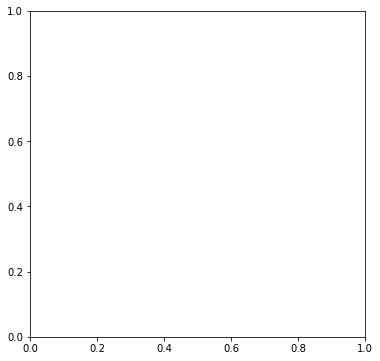

In [122]:
dt_multi = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy = applyStratifiedKFold(dt_multi, 1)

In [123]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.066668,0.045161,0.127373,267.7
1,0.025267,0.014094,0.121925,232.9
2,0.263326,0.274182,0.253349,1635.3
3,0.629821,0.816597,0.512611,4452.5
4,0.591522,0.620875,0.564878,2424.6
5,0.980371,0.984714,0.976066,5887.1
6,0.904040,0.908688,0.899452,9300.0
7,0.753961,0.821578,0.696717,1398.7
8,0.330432,0.271460,0.422913,151.1
9,0.224982,0.192793,0.275817,17.4


In [124]:
computeAverageAccuracy(list_accuracy)

Average Accuracy score == 74.84 %


In [125]:
computeAverageF1Score(df_avg)

Average F1-score == 50.19 %


-----------------------------------------------------------------------------------
### Logistic Regression

#### Binary classification

In [126]:
# bin
# logr_bin = LogisticRegression(dual=False, C=0.1, class_weight='balanced', random_state=0, solver='lbfgs', n_jobs=-1, max_iter=10000)
# logr_bin.fit(train_x, train_y_bin)
# pred_y = logr_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.856413,0.887646,0.872029,0.876373
recall,0.792688,0.924945,0.858817,0.877212
f1-score,0.823319,0.905912,0.864615,0.876103
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.858366,0.890109,0.874237,0.878652
recall,0.797634,0.925674,0.861654,0.879463
f1-score,0.826887,0.907543,0.867215,0.878433
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.856608,0.884935,0.870771,0.874711
recall,0.786882,0.925613,0.856248,0.875543
f1-score,0.820266,0.904817,0.862541,0.874301
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.857554,0.891836,0.874695,0.879463
recall,0.801398,0.924819,0.863109,0.880273
f1-score,0.828525,0.908029,0.868277,0.879334
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.861936,0.889316,0.875626,0.879434
recall,0.795484,0.928038,0.861761,0.880196
f1-score,0.827378,0.908264,0.867821,0.879070
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.852184,0.884530,0.868357,0.872856
recall,0.786667,0.922937,0.854802,0.873753
f1-score,0.818116,0.903326,0.860721,0.872571
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.854565,0.885849,0.870207,0.874558
recall,0.789140,0.924151,0.856646,0.875422
f1-score,0.820550,0.904595,0.862572,0.874261
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.861305,0.890444,0.875874,0.879927
recall,0.797957,0.927431,0.862694,0.880700
f1-score,0.828422,0.908561,0.868491,0.879636
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.855468,0.887425,0.871446,0.875891
recall,0.792366,0.924394,0.858380,0.876742
f1-score,0.822708,0.905532,0.864120,0.875639
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.862109,0.894022,0.878065,0.882504
recall,0.805376,0.927248,0.866312,0.883262
f1-score,0.832777,0.910332,0.871555,0.882341
support,9300.000000,16467.000000,25767.000000,25767.000000


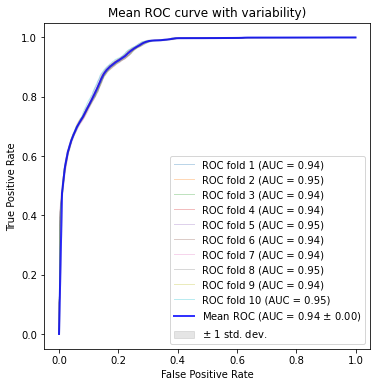

In [127]:
lr_bin = LogisticRegression(dual=False, C=0.1, class_weight='balanced', random_state=0, solver='lbfgs', n_jobs=-1, max_iter=10000)
list_df, list_accuracy_lr = applyStratifiedKFold(lr_bin, 0)

In [128]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.824895,0.857651,0.794559,9300.0
1,0.906691,0.888611,0.925525,16467.3
macro avg,0.865793,0.873131,0.860042,25767.3
weighted avg,0.877169,0.877437,0.878257,25767.3


In [129]:
computeAverageAccuracy(list_accuracy_lr)
computeAverageF1Score(df_avg)

Average Accuracy score == 87.83 %
Average F1-score == 86.86 %


#### Multiclass classification

In [130]:
# one-versus-rest for multiclass classification
logr_classifier = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
logr_classifier.fit(train_x, train_y_multi)

LogisticRegression(class_weight='balanced', max_iter=10000, multi_class='ovr',
                   n_jobs=-1, solver='newton-cg')

In [131]:
pred_y = logr_classifier.predict(test_x)

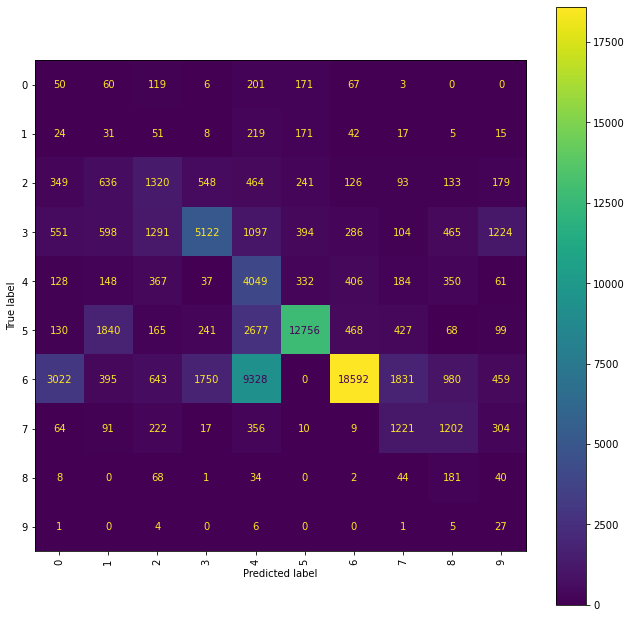

In [132]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [133]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.01      0.07      0.02       677
           1       0.01      0.05      0.01       583
           2       0.31      0.32      0.32      4089
           3       0.66      0.46      0.54     11132
           4       0.22      0.67      0.33      6062
           5       0.91      0.68      0.77     18871
           6       0.93      0.50      0.65     37000
           7       0.31      0.35      0.33      3496
           8       0.05      0.48      0.10       378
           9       0.01      0.61      0.02        44

    accuracy                           0.53     82332
   macro avg       0.34      0.42      0.31     82332
weighted avg       0.76      0.53      0.60     82332



FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.042998,0.032211,0.318740,0.741709,0.419179,0.956851,0.96067,0.392202,0.064229,0.008226,0.393701,0.775569
recall,0.130597,0.094421,0.587768,0.426903,0.538969,0.900289,0.70914,0.366953,0.430464,0.388889,0.457439,0.648324
f1-score,0.064695,0.048035,0.413333,0.541904,0.471586,0.927709,0.81596,0.379157,0.111780,0.016110,0.379027,0.693034
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.00000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.057001,0.021866,0.308775,0.710692,0.427147,0.953266,0.959570,0.375781,0.075911,0.014739,0.390475,0.768345
recall,0.171642,0.064378,0.576758,0.406018,0.547629,0.897401,0.709462,0.344063,0.496689,0.722222,0.493626,0.643822
f1-score,0.085581,0.032644,0.402218,0.516793,0.479942,0.924490,0.815776,0.359223,0.131694,0.028889,0.377725,0.687096
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.053364,0.017570,0.316172,0.724465,0.406774,0.951360,0.959557,0.386139,0.073096,0.008516,0.389701,0.769325
recall,0.171642,0.051502,0.585933,0.395015,0.540017,0.896909,0.699032,0.390558,0.473684,0.411765,0.461606,0.639980
f1-score,0.081416,0.026201,0.410718,0.511263,0.464020,0.923332,0.808834,0.388336,0.126649,0.016687,0.375746,0.683873
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.044720,0.017600,0.323117,0.724677,0.425786,0.957915,0.956200,0.387884,0.066057,0.013767,0.391772,0.771849
recall,0.134328,0.047210,0.606116,0.416124,0.558581,0.908612,0.708925,0.352395,0.430464,0.647059,0.480981,0.650289
f1-score,0.067102,0.025641,0.421523,0.528673,0.483226,0.932613,0.814202,0.369288,0.114537,0.026961,0.378377,0.692181
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.049242,0.016591,0.321862,0.740214,0.425846,0.955528,0.957295,0.391808,0.065306,0.012610,0.393630,0.774556
recall,0.145522,0.047210,0.600612,0.420391,0.570957,0.901478,0.706237,0.362402,0.423841,0.588235,0.476688,0.649823
f1-score,0.073585,0.024554,0.419121,0.536236,0.487839,0.927716,0.812821,0.376532,0.113174,0.024691,0.379627,0.692594
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.055749,0.021739,0.322453,0.729066,0.404519,0.953564,0.956758,0.375839,0.078319,0.014101,0.391211,0.769326
recall,0.179104,0.064378,0.597800,0.406783,0.539191,0.899949,0.701828,0.320229,0.543046,0.705882,0.495819,0.641363
f1-score,0.085031,0.032503,0.418933,0.522203,0.462246,0.925981,0.809701,0.345812,0.136895,0.027650,0.376695,0.684886
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.053676,0.018651,0.313325,0.733664,0.431196,0.960080,0.962267,0.369706,0.070772,0.015169,0.392851,0.775117
recall,0.172285,0.055794,0.580685,0.398473,0.551753,0.898760,0.704731,0.368120,0.509934,0.764706,0.500524,0.643109
f1-score,0.081851,0.027957,0.407027,0.516448,0.484081,0.928408,0.813606,0.368911,0.124294,0.029748,0.378233,0.688277
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.054827,0.023129,0.318035,0.735741,0.428437,0.953497,0.959865,0.376147,0.069968,0.013498,0.393314,0.773540
recall,0.172285,0.072961,0.601467,0.402740,0.562887,0.898590,0.702043,0.351680,0.430464,0.705882,0.490100,0.643963
f1-score,0.083183,0.035124,0.416068,0.520540,0.486544,0.925230,0.810955,0.363502,0.120370,0.026490,0.378801,0.687867
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.056306,0.021944,0.322493,0.734873,0.416056,0.958648,0.962128,0.383976,0.064176,0.007584,0.392818,0.774881
recall,0.187266,0.060086,0.582263,0.414645,0.538557,0.905724,0.702043,0.363117,0.443709,0.388889,0.458630,0.644662
f1-score,0.086580,0.032147,0.415086,0.530155,0.469446,0.931435,0.811762,0.373255,0.112134,0.014878,0.377688,0.690032
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.052493,0.008969,0.312029,0.723851,0.422201,0.960131,0.960642,0.368341,0.061602,0.013230,0.388349,0.771679
recall,0.149254,0.025862,0.582263,0.410377,0.550515,0.895872,0.713871,0.345961,0.397351,0.666667,0.473799,0.645360
f1-score,0.077670,0.013319,0.406317,0.523796,0.477895,0.926889,0.819073,0.356801,0.106667,0.025946,0.373437,0.689595
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



Average Accuracy score == 64.51 %
Average F1-score == 40.35 %


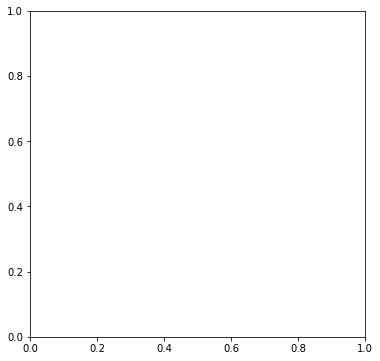

In [134]:
lr_multi = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
list_df, list_accuracy = applyStratifiedKFold(lr_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

---------------------------------------------------------------------
## Support Vector Machine

#### binary problem

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.851419,0.890676,0.871048,0.876508
recall,0.799785,0.921180,0.860483,0.877367
f1-score,0.824795,0.905672,0.865233,0.876482
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.852791,0.894055,0.873423,0.879162
recall,0.806667,0.921363,0.864015,0.879967
f1-score,0.829088,0.907503,0.868295,0.879202
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.852928,0.893290,0.873109,0.878723
recall,0.805054,0.921606,0.863330,0.879541
f1-score,0.828300,0.907227,0.867763,0.878741
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.856094,0.892409,0.874252,0.879302
recall,0.802796,0.923787,0.863291,0.880118
f1-score,0.828589,0.907827,0.868208,0.879228
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.852972,0.889852,0.871412,0.876541
recall,0.797849,0.922330,0.860089,0.877401
f1-score,0.824490,0.905800,0.865145,0.876453
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.852180,0.894215,0.873198,0.879044
recall,0.807097,0.920933,0.864015,0.879846
f1-score,0.829026,0.907377,0.868202,0.879098
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.852948,0.892154,0.872551,0.878003
recall,0.802688,0.921844,0.862266,0.878837
f1-score,0.827055,0.906756,0.866906,0.877990
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.851776,0.891770,0.871773,0.877335
recall,0.802043,0.921176,0.861609,0.878178
f1-score,0.826162,0.906234,0.866198,0.877334
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.864906,0.891283,0.878094,0.881763
recall,0.799247,0.929495,0.864371,0.882485
f1-score,0.830781,0.909988,0.870385,0.881400
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.851044,0.891568,0.871306,0.876942
recall,0.801720,0.920751,0.861236,0.877789
f1-score,0.825646,0.905924,0.865785,0.876950
support,9300.000000,16467.000000,25767.000000,25767.000000


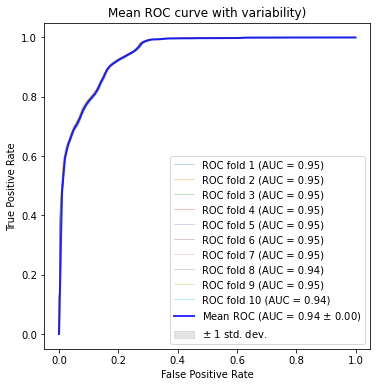

Average Accuracy score == 87.92 %
Average F1-score == 87.00 %


In [135]:
lsvm_bin = LinearSVC(dual=False, tol=1e-05, class_weight='balanced', random_state=0, max_iter=10000)
# lsvm_bin.fit(train_x, train_y_bin)
# pred_y = lsvm_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))
list_df, list_accuracy_lsvm = applyStratifiedKFold(lsvm_bin, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_lsvm)
computeAverageF1Score(df_avg)

#### multiclass problem

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.069307,0.051064,0.316996,0.706291,0.437098,0.941167,0.948980,0.305745,0.080372,0.013348,0.387037,0.759073
recall,0.052239,0.051502,0.549847,0.410959,0.504330,0.945643,0.720000,0.449213,0.629139,0.666667,0.497954,0.658802
f1-score,0.059574,0.051282,0.402147,0.519591,0.468313,0.943399,0.818782,0.363847,0.142536,0.026172,0.379564,0.692096
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.073276,0.054054,0.309950,0.708870,0.448140,0.943876,0.951240,0.291323,0.074979,0.010204,0.386591,0.760798
recall,0.063433,0.060086,0.529664,0.419942,0.516701,0.939868,0.721613,0.429900,0.589404,0.500000,0.477061,0.658297
f1-score,0.068000,0.056911,0.391059,0.527429,0.479985,0.941867,0.820666,0.347298,0.133034,0.020000,0.378625,0.693357
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.090535,0.016129,0.319224,0.728833,0.428419,0.938409,0.957492,0.289015,0.069626,0.012972,0.385065,0.763692
recall,0.082090,0.012876,0.553517,0.438805,0.496287,0.941916,0.719355,0.438484,0.526316,0.647059,0.485670,0.660781
f1-score,0.086106,0.014320,0.404922,0.547799,0.459862,0.940159,0.821514,0.348394,0.122982,0.025434,0.377149,0.695608
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.089844,0.054726,0.315371,0.704930,0.450054,0.939820,0.949908,0.286007,0.073493,0.010033,0.387419,0.759138
recall,0.085821,0.047210,0.558410,0.420615,0.511139,0.941736,0.719785,0.398856,0.589404,0.529412,0.480239,0.657935
f1-score,0.087786,0.050691,0.403091,0.526864,0.478656,0.940777,0.818988,0.333134,0.130690,0.019694,0.379037,0.692430
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.095238,0.040134,0.321591,0.726616,0.445848,0.948001,0.957507,0.298237,0.083544,0.015366,0.393208,0.768147
recall,0.082090,0.051502,0.563914,0.429149,0.509488,0.938339,0.722043,0.447462,0.655629,0.764706,0.516432,0.662825
f1-score,0.088176,0.045113,0.409596,0.539602,0.475549,0.943145,0.823270,0.357919,0.148204,0.030127,0.386070,0.698247
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.077273,0.048980,0.310537,0.717997,0.441894,0.936188,0.957037,0.285508,0.076222,0.014337,0.386597,0.761858
recall,0.063433,0.051502,0.544010,0.428347,0.500413,0.939528,0.720968,0.423874,0.609272,0.705882,0.498723,0.658672
f1-score,0.069672,0.050209,0.395380,0.536579,0.469336,0.937855,0.822397,0.341197,0.135493,0.028103,0.378622,0.693579
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.082051,0.068441,0.314158,0.702071,0.436312,0.944957,0.957496,0.291864,0.073831,0.013289,0.388447,0.761550
recall,0.059925,0.077253,0.557457,0.411276,0.511340,0.939018,0.707312,0.441029,0.596026,0.705882,0.500652,0.653627
f1-score,0.069264,0.072581,0.401851,0.518697,0.470856,0.941978,0.813605,0.351267,0.131387,0.026087,0.379757,0.689547
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.040936,0.050542,0.320535,0.716872,0.438174,0.945830,0.953978,0.287619,0.075684,0.014035,0.384421,0.762810
recall,0.026217,0.060086,0.571516,0.418014,0.502680,0.940207,0.715484,0.431737,0.622517,0.705882,0.499434,0.657236
f1-score,0.031963,0.054902,0.410718,0.528093,0.468216,0.943010,0.817696,0.345241,0.134961,0.027523,0.376232,0.692346
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.052846,0.054688,0.318876,0.718038,0.446940,0.941376,0.956250,0.314030,0.066892,0.016189,0.388612,0.765067
recall,0.048689,0.060086,0.562080,0.417565,0.508866,0.941057,0.723871,0.476769,0.523179,0.722222,0.498438,0.662475
f1-score,0.050682,0.057260,0.406907,0.528050,0.475897,0.941216,0.823990,0.378655,0.118619,0.031669,0.381294,0.696603
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.073930,0.043269,0.315396,0.710638,0.439077,0.936556,0.957283,0.299483,0.076063,0.017310,0.386901,0.761480
recall,0.070896,0.038793,0.541284,0.412624,0.502268,0.937829,0.722903,0.455325,0.675497,0.722222,0.507964,0.658361
f1-score,0.072381,0.040909,0.398559,0.522097,0.468552,0.937192,0.823746,0.361316,0.136729,0.033810,0.379529,0.692590
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



Average Accuracy score == 65.89 %
Average F1-score == 40.58 %


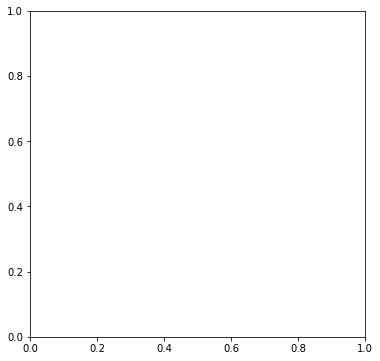

In [136]:
# LinearSVC implements “one-vs-the-rest” multi-class strategy, thus training n_classes models
# it scales better than SVC with kernel=linear

# VERY LONG RUNNING TIME


lsvm_multi = LinearSVC(dual=False, class_weight='balanced', max_iter=15000)
# lsvm.fit(train_x, train_y) 
# pred_y = lsvm.predict(test_x)
# print(classification_report(test_y, pred_y))
list_df, list_accuracy = applyStratifiedKFold(lsvm_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)


## K Nearest Neighbours

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.906640,0.951602,0.929121,0.935375
recall,0.914731,0.946806,0.930769,0.935230
f1-score,0.910667,0.949198,0.929933,0.935292
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.907564,0.950247,0.928905,0.934842
recall,0.912151,0.947535,0.929843,0.934764
f1-score,0.909851,0.948889,0.929370,0.934800
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.903694,0.949031,0.926362,0.932668
recall,0.910108,0.945227,0.927667,0.932552
f1-score,0.906890,0.947125,0.927007,0.932604
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.903881,0.948459,0.926170,0.932369
recall,0.909032,0.945406,0.927219,0.932278
f1-score,0.906449,0.946930,0.926690,0.932319
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.898906,0.948930,0.923918,0.930875
recall,0.910215,0.942187,0.926201,0.930648
f1-score,0.904525,0.945547,0.925036,0.930741
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.901333,0.948145,0.924739,0.931250
recall,0.908602,0.943827,0.926215,0.931113
f1-score,0.904953,0.945981,0.925467,0.931173
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.904905,0.947173,0.926039,0.931918
recall,0.906559,0.946195,0.926377,0.931890
f1-score,0.905731,0.946684,0.926208,0.931903
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.902460,0.949621,0.926041,0.932600
recall,0.911290,0.944374,0.927832,0.932433
f1-score,0.906854,0.946990,0.926922,0.932504
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.902489,0.939763,0.921126,0.926310
recall,0.892688,0.945527,0.919108,0.926456
f1-score,0.897562,0.942637,0.920099,0.926368
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.908348,0.948030,0.928189,0.933708
recall,0.907957,0.948260,0.928109,0.933714
f1-score,0.908152,0.948145,0.928149,0.933711
support,9300.000000,16467.000000,25767.000000,25767.000000


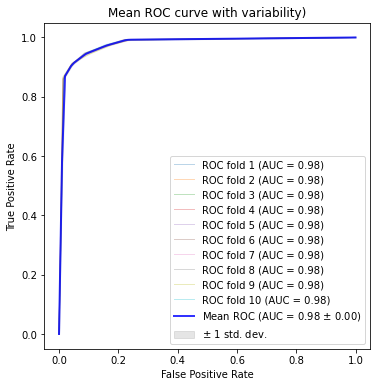

Average Accuracy score == 93.21 %
Average F1-score == 92.79 %


In [137]:
knn_bin = KNeighborsClassifier(n_jobs=-1)
# lsvm_bin.fit(train_x, train_y_bin)
# pred_y = lsvm_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))
list_df, list_accuracy_knn = applyStratifiedKFold(knn_bin, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_knn)
computeAverageF1Score(df_avg)

## Random Forest

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.914313,0.957859,0.936086,0.942143
recall,0.925914,0.950996,0.938455,0.941943
f1-score,0.920077,0.954415,0.937246,0.942022
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.925858,0.957754,0.941806,0.946242
recall,0.925161,0.958161,0.941661,0.946251
f1-score,0.925510,0.957958,0.941734,0.946247
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.916897,0.959562,0.938229,0.944164
recall,0.928925,0.952453,0.940689,0.943962
f1-score,0.922871,0.955994,0.939433,0.944040
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.917417,0.961095,0.939256,0.945331
recall,0.931720,0.952633,0.942176,0.945085
f1-score,0.924513,0.956845,0.940679,0.945176
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.914839,0.956880,0.935860,0.941707
recall,0.924086,0.951418,0.937752,0.941553
f1-score,0.919439,0.954141,0.936790,0.941616
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.919453,0.957759,0.938606,0.943934
recall,0.925484,0.954211,0.939848,0.943843
f1-score,0.922459,0.955982,0.939220,0.943883
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.921659,0.954692,0.938176,0.942769
recall,0.919677,0.955851,0.937764,0.942795
f1-score,0.920667,0.955271,0.937969,0.942782
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.922459,0.958186,0.940323,0.945291
recall,0.926129,0.956033,0.941081,0.945240
f1-score,0.924290,0.957109,0.940699,0.945264
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.915162,0.958346,0.936754,0.942760
recall,0.926774,0.951479,0.939126,0.942562
f1-score,0.920932,0.954900,0.937916,0.942640
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.921208,0.957689,0.939448,0.944522
recall,0.925269,0.955305,0.940287,0.944464
f1-score,0.923234,0.956495,0.939865,0.944490
support,9300.000000,16467.000000,25767.000000,25767.000000


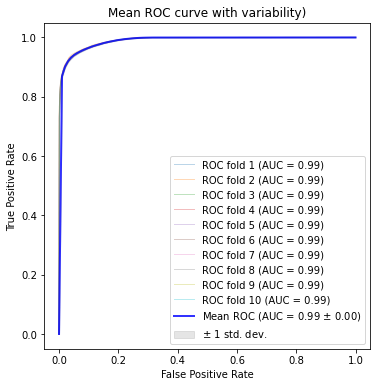

Average Accuracy score == 94.38 %
Average F1-score == 94.03 %


In [138]:
randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
list_df, list_accuracy_randf = applyStratifiedKFold(randf, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_randf)
computeAverageF1Score(df_avg)

## Multi-Layer Perceptron

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.893002,0.957390,0.925196,0.934151
recall,0.926129,0.937333,0.931731,0.933289
f1-score,0.909264,0.947255,0.928260,0.933544
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.895603,0.950445,0.923024,0.930652
recall,0.913226,0.939883,0.926555,0.930262
f1-score,0.904328,0.945135,0.924732,0.930407
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.906588,0.949066,0.927827,0.933735
recall,0.910000,0.947049,0.928524,0.933677
f1-score,0.908291,0.948056,0.928174,0.933704
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.894868,0.957500,0.926184,0.934894
recall,0.926237,0.938544,0.932390,0.934102
f1-score,0.910282,0.947927,0.929105,0.934340
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.894156,0.955653,0.924904,0.933457
recall,0.922903,0.938301,0.930602,0.932743
f1-score,0.908302,0.946898,0.927600,0.932967
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.896765,0.953155,0.924960,0.932802
recall,0.918172,0.940305,0.929238,0.932317
f1-score,0.907342,0.946686,0.927014,0.932486
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.903003,0.949985,0.926494,0.933028
recall,0.911935,0.944677,0.928306,0.932860
f1-score,0.907447,0.947324,0.927385,0.932931
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.904696,0.947625,0.926160,0.932130
recall,0.907419,0.946013,0.926716,0.932084
f1-score,0.906055,0.946818,0.926437,0.932106
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.903754,0.948282,0.926018,0.932211
recall,0.908710,0.945345,0.927027,0.932122
f1-score,0.906225,0.946811,0.926518,0.932163
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.917049,0.945297,0.931173,0.935102
recall,0.902258,0.953908,0.928083,0.935266
f1-score,0.909593,0.949583,0.929588,0.935150
support,9300.000000,16467.000000,25767.000000,25767.000000


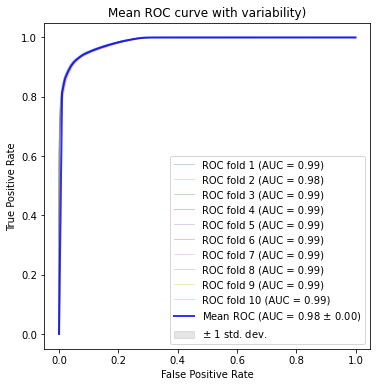

Average Accuracy score == 93.29 %
Average F1-score == 92.89 %


In [139]:
# very long running time
mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
list_df, list_accuracy_mlp = applyStratifiedKFold(mlp, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_mlp)
computeAverageF1Score(df_avg)

# 5. Validation

The difference between the performance of machine learning models are true and reliable or are they just due to statistical chance?

Now we need to: formulate an hypothesis, determine the significance level, determine the type of test, calculate the test statistics and the p values, and finally make decisions. 

The paired t-test wants to find out if there is a real difference between the classifiers, so assuming we are interested in the accuracy, we start by calculating the difference of the accuracies between the models (learned with a k-fold cross validation approach). 

The assumption is that accuracies are drawn from a normal distribution (with unknown variance). The Null Hypothesis states that the accuracies of two models A and B are drawn from the same distribution. Hence, the difference in the accuracies has an expected value equal to 0 (E[diff] = 0). Basically, there is now difference between the two models. The Alternative Hypothesis states that the accuracies are drawn from two different distributions, basically the models are actually different, so one is better than the other. 


We need to:
    - take a sample of N observations from the k-fold cross validation (the assumption is that these results come from a normal distribution with fixed mean and variance)
    - copute the sample mean and sample variance for these observations
    - compute the t-statistic
    - use the t-distribution with N-1 degress of fredoom to estimate how likely it is that the true mean is in a given range
    - reject the null hypothesis at significance level p if the t-statistic does not lie in the interval ... TO DO [-t_{p/2, n-1, +t_{p/2,n-1}]

 TO DO CHECK
 We could then select and use the paired Student’s t-test to check if the difference in the mean accuracy between the two models is statistically significant, e.g. reject the null hypothesis that assumes that the two samples have the same distribution.

In fact, this is a common way to compare classifiers with perhaps hundreds of published papers using this methodology.

The problem is, a key assumption of the paired Student’s t-test has been violated.

Namely, the observations in each sample are not independent. As part of the k-fold cross-validation procedure, a given observation will be used in the training dataset (k-1) times. This means that the estimated skill scores are dependent, not independent, and in turn that the calculation of the t-statistic in the test will be misleadingly wrong along with any interpretations of the statistic and p-value.

Unfortunately, selecting an appropriate statistical hypothesis test for model selection in applied machine learning is more challenging than it first appears

Let's say that we want to set a level of significance (alpha) of 0.05. We want to be pretty sure that the models are statistically different to each other. If the p-value returned by the function is smaller than alpha we can successfully reject the null hypothesis. 

In [140]:
! pip install mlxtend

#### Binary Tree Vs Others

In [141]:
# this involves 5 repeats of 2-fold cross validation
# https://rasbt.github.io/mlxtend/user_guide/evaluate/paired_ttest_5x2cv/
from mlxtend.evaluate import paired_ttest_5x2cv
alpha=0.05

In [142]:
t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=lr_bin, X=train_x, y=train_y_bin)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Fail to reject null hypotesis")
else:
  print("Null Hypotesis Rejected")

t statistic: 19.674
p value: 0.000
Null Hypotesis Rejected


In [143]:
t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=lsvm_bin, X=train_x, y=train_y_bin)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Fail to reject null hypotesis")
else:
  print("Null Hypotesis Rejected")

t statistic: 39.777
p value: 0.000
Null Hypotesis Rejected


In [144]:
# VERY long running time (approx: 1h)
t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=knn_bin, X=train_x, y=train_y_bin)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Fail to reject null hypotesis")
else:
  print("Null Hypotesis Rejected")

t statistic: -7.169
p value: 0.001
Null Hypotesis Rejected


In [145]:
t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=randf, X=train_x, y=train_y_bin)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Fail to reject null hypotesis")
else:
  print("Null Hypotesis Rejected")

t statistic: -27.758
p value: 0.000
Null Hypotesis Rejected


In [146]:
# long running time
t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=mlp, X=train_x, y=train_y_bin)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

if p > alpha:
  print("Fail to reject null hypotesis")
else:
  print("Null Hypotesis Rejected")

t statistic: -5.224
p value: 0.003
Null Hypotesis Rejected


#### Logistic Regression vs Others

In [160]:
from scipy.stats import wilcoxon

stat, p = wilcoxon(list_accuracy_lr, list_accuracy_lsvm)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")
    

p: 0.431640625, alpha: 0.05
Cannot reject the Null Hypothesis


In [161]:
stat, p = wilcoxon(list_accuracy_lr, list_accuracy_knn)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


In [162]:
stat, p = wilcoxon(list_accuracy_lr, list_accuracy_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


In [163]:
stat, p = wilcoxon(list_accuracy_lr, list_accuracy_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


#### Support Vector Machine Vs Others

In [164]:
stat, p = wilcoxon(list_accuracy_lsvm, list_accuracy_knn)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


In [165]:
stat, p = wilcoxon(list_accuracy_lsvm, list_accuracy_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


In [166]:
stat, p = wilcoxon(list_accuracy_lsvm, list_accuracy_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


#### KNN Vs Others

In [167]:
stat, p = wilcoxon(list_accuracy_knn, list_accuracy_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


In [168]:
stat, p = wilcoxon(list_accuracy_knn, list_accuracy_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.322265625, alpha: 0.05
Cannot reject the Null Hypothesis


#### Random Forest Vs Others

In [169]:
stat, p = wilcoxon(list_accuracy_randf, list_accuracy_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")

p: 0.001953125, alpha: 0.05


#### No more possible couple. 

## Test for class reductio in multi-class problem

In [148]:
train_y

NameError: name 'train_y' is not defined

In [ ]:
train_y_9 = train_y.copy(deep=True)
train_y_9.loc[train_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
train_y_9.loc[train_y_9 == 'DoS'] = 'Backdoor_or_Dos'


test_y_9 = test_y.copy(deep=True)
test_y_9.loc[test_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
test_y_9.loc[test_y_9 == 'DoS'] = 'Backdoor_or_Dos'
test_y_9.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_9)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_9, pred_y))

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_9, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_7 = train_y_9.copy(deep=True)
train_y_7.loc[train_y_7 == 'Backdoor_or_Dos'] = 'BADE'
train_y_7.loc[train_y_7 == 'Analysis'] = 'BADE'
train_y_7.loc[train_y_7 == 'Exploits'] = 'BADE'


test_y_7 = test_y_9.copy(deep=True)
test_y_7.loc[test_y_7 == 'Backdoor_or_Dos'] = 'BADE'
test_y_7.loc[test_y_7 == 'Analysis'] = 'BADE'
test_y_7.loc[test_y_7 == 'Exploits'] = 'BADE'

test_y_7.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_7)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_7, pred_y))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_7, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_2 = train_y_7.copy(deep=True)
train_y_2.loc[train_y_7 != 'Normal'] = 'Attack'


test_y_2 = test_y_7.copy(deep=True)
test_y_2.loc[test_y_2 != 'Normal'] = 'Attack'


test_y_2.sample(100)

In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_2)
pred_y_2 = classifier.predict(test_x)
print(classification_report(test_y_2, pred_y_2))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_2, pred_y_2, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
# randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
# randf.fit(train_x, train_y_2)

# pred_y_2 = randf.predict(test_x)
# print(classification_report(test_y_2, pred_y_2))

mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
mlp.fit(train_x, train_y_2)
pred_y_2 = mlp.predict(test_x)
print(classification_report(test_y_2, pred_y_2))

# Unsupervised Learning

In [ ]:
def evaluate_clustering(y_true, y_pred):
    # Matrix $C$ such that $C_{ij}$ is the number of samples in true class $i$ and in predicted cluster $j$.
    cm = contingency_matrix(y_true, y_pred)
    print(f'contingency matrix: \n {cm}')
    for enu, row in enumerate(cm):
        print(f'Row{enu}: sum = {sum(row)}')    
    homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(y_true, y_pred)
#   homogeneity is high if all the clusters contain only data points which are members of a single class.
    print(f'homogeneity score: {homogeneity}')
#   completeness is high if all the data points that are members of a given class are elements of the same cluster.
    print(f'completeness score: {completeness}')
    print(f'v-measure score: {v_measure}')

In [ ]:
train_y_bin = train_y.apply(lambda x: 'normal' if x == 'Normal' else 'attack')
train_y_bin.value_counts()

In [ ]:

def plot_pca(X,Y):
    # Use PCA to reduce dimensionality so we can visualize the dataset on a 2d plot
    pca = PCA(n_components=2)

    data_pca = pca.fit_transform(X)

    print(f'percentage of variance explained by principal components: {pca.explained_variance_ratio_}')
    print(f'sum: {sum(pca.explained_variance_ratio_)}')

    plt.figure(figsize=(15,10))
    colors = ['navy', 'turquoise', 'darkorange', 'red', 'purple', 'green', 'pink', 'yellow', 'black', 'orange']
    
    for color, cat in zip(colors, np.unique(Y)):
        plt.scatter(data_pca[Y==cat, 0], data_pca[Y==cat, 1],
                    color=color, alpha=.8, lw=2, label=cat)
    plt.legend(loc='best', shadow=False, scatterpoints=1)

    plt.show()

    
# %matplotlib notebook
plot_pca(train_x, train_y)
plot_pca(train_x, train_y_bin)


In [ ]:
def apply_kmeans(X, y, k_values, n_components = 2):
    for k in k_values:
        print(f'k = {k}')
        kmeans = KMeans(n_clusters = k, random_state = 17).fit(X)
        pred_y = kmeans.labels_
        evaluate_clustering(y, pred_y)

        
# If 0 < n_components < 1 and svd_solver == 'full' (automatically selected), 
# select the number of components such that 
# the amount of variance that needs to be explained is greater 
# than the percentage specified by n_components.
for components in [0.95,2,None]: # arguments for the PCA reduction, different cases
    print()
    if components:
        print(components)
        pca = PCA(n_components=components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y, [10])
#     apply_kmeans(data_pca,train_y,[8])

In [ ]:
for components in [0.95,2,None]:
    print()
    if components:
        pca = PCA(n_components = components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y_bin, [2])

As we can see from the previous results, this dataset is absolutely not suitable for a clustering approach. 
### TODO comments

# Outlier Detection

In [ ]:
train_y.value_counts().index

In [ ]:
final_indices = []
for net_type in train_y.value_counts().index:
    if net_type == 'Normal':
        final_indices.extend(train_y[train_y == net_type].index.values)
    final_indices.extend(train_y[train_y == net_type].sample(10).index.values)
len(final_indices)
train_y_sample = train_y.loc[final_indices]
train_y_bin_sample = train_y_bin.loc[final_indices]
print(train_y_sample.value_counts())
print(train_y_bin_sample.value_counts())
train_x_sample = train_x.loc[final_indices,:]

In [ ]:
def apply_LOF(X, contamination):
    lof = LOF(contamination = contamination)
    y_lof = lof.fit_predict(X)
    unique, counts = np.unique(y_lof, return_counts = True)
    print(dict(zip(unique, counts)))
    pred_y = np.minimum(y_lof,0)*(-1)
    return pred_y

pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x_sample)

print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005, 0.001, 'auto']:
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_sample, pred_y)
    evaluate_clustering(train_y_bin_sample, pred_y)


In [ ]:
train_y_fuzzers = train_y.apply(lambda x: 'outlier' if x == 'Fuzzers' else 'normal')

In [ ]:
pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x)
print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005,'auto']:
    print()
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_fuzzers, pred_y)
